## Exploratory Data Analysis

In [1]:
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

In [149]:
df = pd.read_csv("../data/raw/train.csv")

In [3]:
df.head()

,Unnamed: 0,artist_name,track_name,release_date,genre,lyrics,len,dating,violence,world/life,...,communication,obscene,music,movement/places,light/visual perceptions,family/spiritual,sadness,feelings,topic,age
0,0,mukesh,mohabbat bhi jhoothi,1950,pop,hold time feel break feel untrue convince spea...,95,0.000598,0.063746,0.000598,...,0.263751,0.000598,0.039288,0.000598,0.000598,0.000598,0.380299,0.117175,sadness,1.0
1,4,frankie laine,i believe,1950,pop,believe drop rain fall grow believe darkest ni...,51,0.035537,0.096777,0.443435,...,0.001284,0.001284,0.118034,0.001284,0.212681,0.051124,0.001284,0.001284,world/life,1.0
2,6,johnnie ray,cry,1950,pop,sweetheart send letter goodbye secret feel bet...,24,0.002770,0.002770,0.002770,...,0.250668,0.002770,0.323794,0.002770,0.002770,0.002770,0.002770,0.225422,music,1.0
3,10,pérez prado,patricia,1950,pop,kiss lips want stroll charm mambo chacha merin...,54,0.048249,0.001548,0.001548,...,0.001548,0.001548,0.001548,0.129250,0.001548,0.001548,0.225889,0.001548,romantic,1.0
4,12,giorgos papadopoulos,apopse eida oneiro,1950,pop,till darling till matter know till dream live ...,48,0.001350,0.001350,0.417772,...,0.001350,0.001350,0.001350,0.001350,0.001350,0.029755,0.068800,0.001350,romantic,1.0


Unnamed: 0 can be dropped
string in topic column for each song == topic with highest score

how genre was determined for each song? => does not align with how i'd categorize them

how artist was determined? => dcom songs are either "cast of [movie title]"/"[movie title] cast" or the actor/singer's name
(zac efron listed for "what time is it", but high school musical cast for "stick to the status quo")
        only one artist is listed; seems to be the first artist on spotify

how topic was determined for each song? => most likely sentiment analysis-esque program
"sing" - mcr is categorized as "music" (0.375), when i think the actual song's topic is "world/life", the second highest topic at 0.293

In [4]:
df.describe()

,Unnamed: 0,release_date,len,dating,violence,world/life,night/time,shake the audience,family/gospel,romantic,communication,obscene,music,movement/places,light/visual perceptions,family/spiritual,sadness,feelings,age
count,28362.000000,28362.000000,28362.000000,28362.000000,28362.000000,28362.000000,28362.000000,28362.000000,28362.000000,28362.000000,28362.000000,28362.000000,28362.000000,28362.000000,28362.000000,28362.000000,28362.000000,28362.000000,28362.000000
mean,42948.166878,1990.239652,73.030534,0.021110,0.118371,0.120984,0.057356,0.017418,0.017045,0.048676,0.076651,0.097185,0.060067,0.047417,0.049008,0.024155,0.129402,0.030995,0.425148
std,24747.811462,18.486997,41.831605,0.052366,0.178658,0.172216,0.111892,0.040658,0.041968,0.106071,0.109497,0.181314,0.123346,0.091559,0.089553,0.051032,0.181149,0.071656,0.264100
min,0.000000,1950.000000,1.000000,0.000291,0.000284,0.000291,0.000289,0.000284,0.000289,0.000284,0.000291,0.000289,0.000289,0.000284,0.000284,0.000284,0.000284,0.000289,0.014286
25%,20393.500000,1975.000000,42.000000,0.000923,0.001120,0.001170,0.001032,0.000993,0.000923,0.000975,0.001144,0.001053,0.000975,0.000993,0.000993,0.000957,0.001144,0.000993,0.185714
50%,45407.000000,1991.000000,63.000000,0.001462,0.002506,0.006579,0.001949,0.001595,0.001504,0.001754,0.002632,0.001815,0.001815,0.001645,0.001815,0.001645,0.005263,0.001754,0.414286
75%,64089.500000,2007.000000,93.000000,0.004049,0.192538,0.197854,0.065778,0.009989,0.004785,0.042304,0.132111,0.088799,0.055109,0.054373,0.064302,0.025515,0.235115,0.032617,0.642857
max,82451.000000,2019.000000,199.000000,0.647706,0.981781,0.962105,0.973684,0.497463,0.545303,0.940789,0.645829,0.992298,0.956938,0.638021,0.667782,0.618073,0.981424,0.958810,1.000000


topics that don't go above .70: dating, shake the audience, family/gospel, communication, movement/places, light/visual perceptions, family/spiritual
what are the songs length 1 and 199

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28362 entries, 0 to 28361
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                28362 non-null  int64  
 1   artist_name               28362 non-null  object 
 2   track_name                28362 non-null  object 
 3   release_date              28362 non-null  int64  
 4   genre                     28362 non-null  object 
 5   lyrics                    28362 non-null  object 
 6   len                       28362 non-null  int64  
 7   dating                    28362 non-null  float64
 8   violence                  28362 non-null  float64
 9   world/life                28362 non-null  float64
 10  night/time                28362 non-null  float64
 11  shake the audience        28362 non-null  float64
 12  family/gospel             28362 non-null  float64
 13  romantic                  28362 non-null  float64
 14  commun

delete: unnamed: 0
more relevant:      artist_name, genre, topic (both the column named topic, and columns of specific topics)
medium relevant:    release_date (album; contemporary vs classic), age, lyrics [similarity; percentage of unique words]
less relevant:      track_name

data in release_date and age occupy the same niche; release_date is categorical, age is quantitative

song recommendations are based off of two things: how similar two songs are (lyrical content, technical music aspects); other songs listened to by someone who likes/has listened to the song

in this preoject we can only use similarity for this

## Univariate Analysis

### Quantitative Data

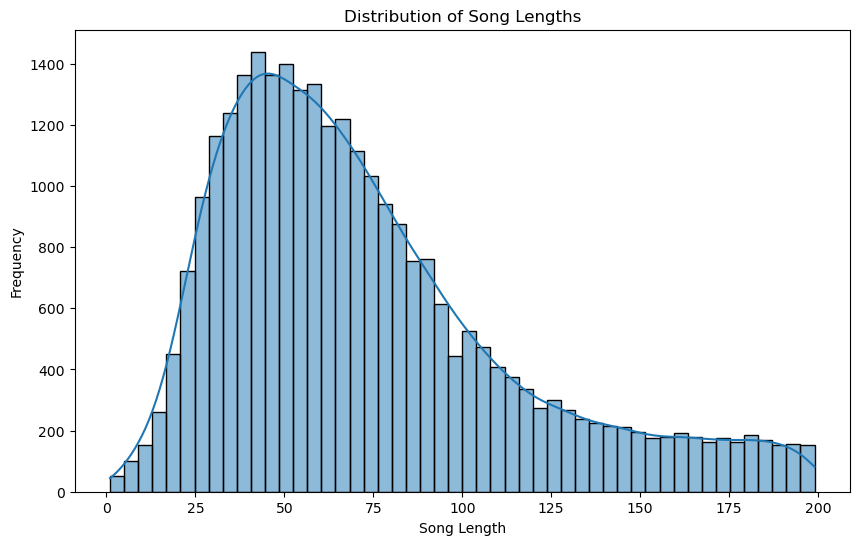

In [10]:
plt.figure(figsize=(10, 6))
sns.histplot(df["len"], bins=50, kde=True)
plt.title("Distribution of Song Lengths")
plt.xlabel("Song Length")
plt.ylabel("Frequency")
plt.show()

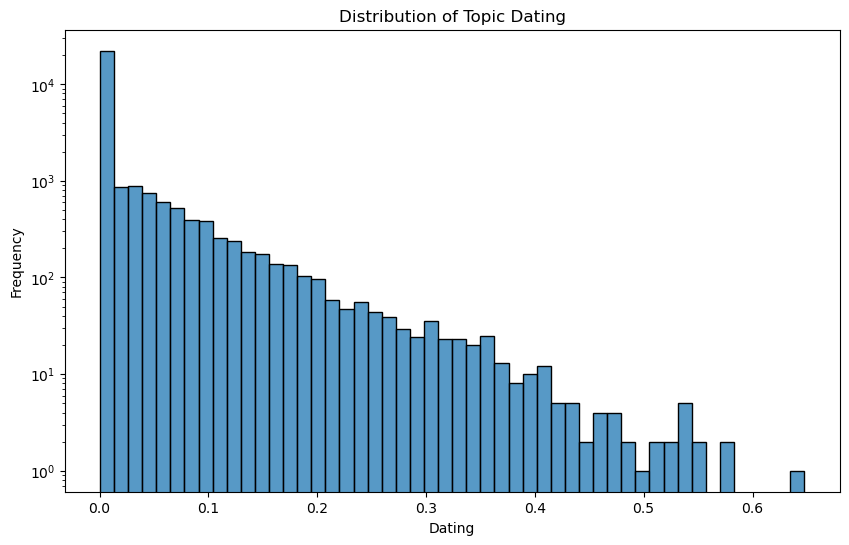

In [16]:
plt.figure(figsize=(10, 6))
sns.histplot(df["dating"], bins=50, kde=False)
plt.title("Distribution of Topic: Dating")
plt.xlabel("Dating")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

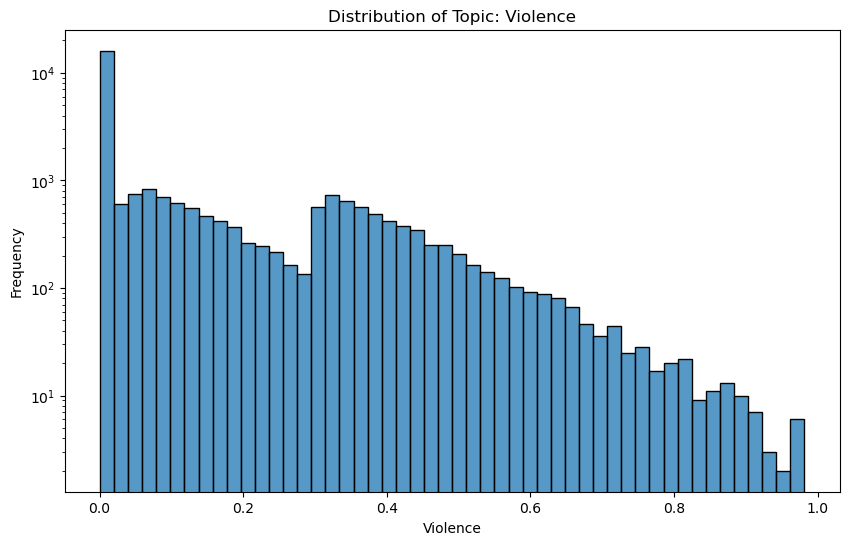

In [17]:
plt.figure(figsize=(10, 6))
sns.histplot(df["violence"], bins=50, kde=False)
plt.title("Distribution of Topic: Violence")
plt.xlabel("Violence")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

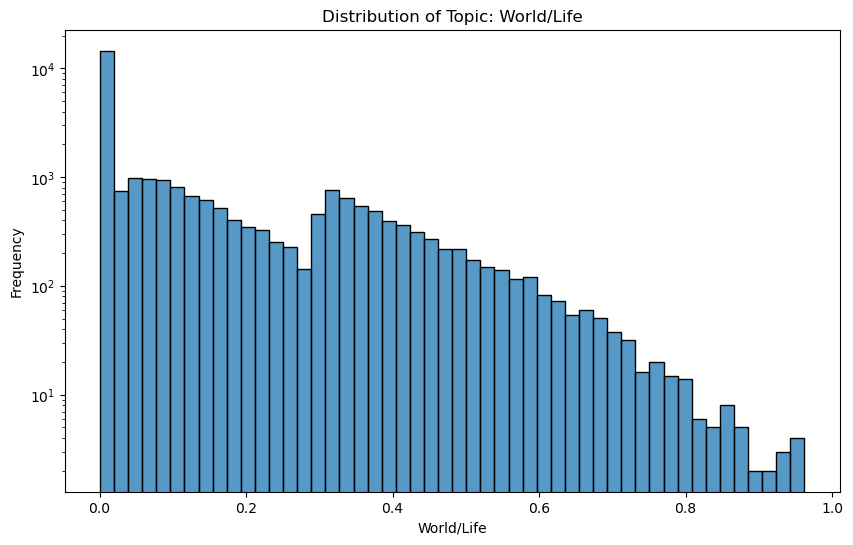

In [18]:
plt.figure(figsize=(10, 6))
sns.histplot(df["world/life"], bins=50, kde=False)
plt.title("Distribution of Topic: World/Life")
plt.xlabel("World/Life")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

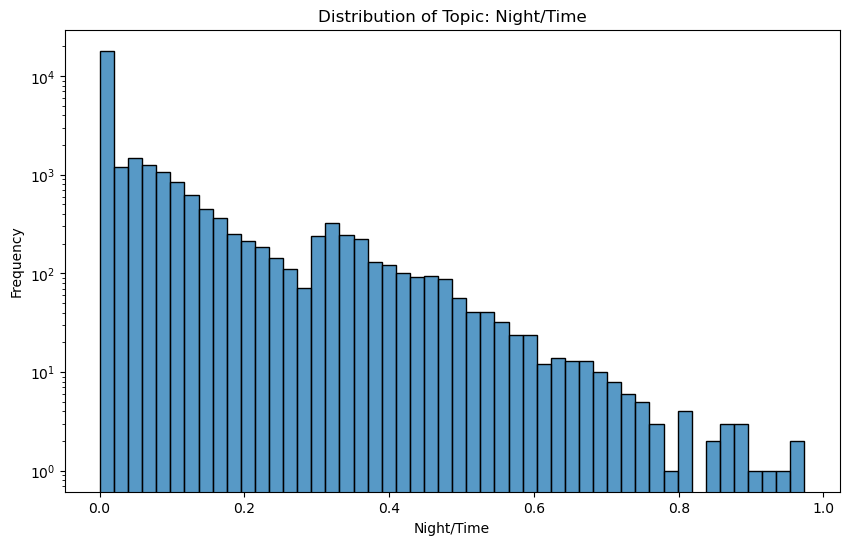

In [20]:
plt.figure(figsize=(10, 6))
sns.histplot(df["night/time"], bins=50, kde=False)
plt.title("Distribution of Topic: Night/Time")
plt.xlabel("Night/Time")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

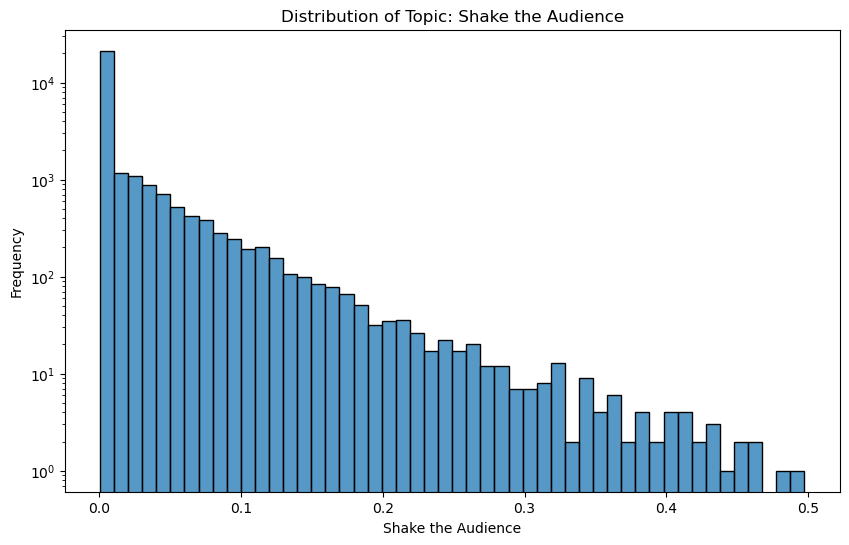

In [21]:
plt.figure(figsize=(10, 6))
sns.histplot(df["shake the audience"], bins=50, kde=False)
plt.title("Distribution of Topic: Shake the Audience")
plt.xlabel("Shake the Audience")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

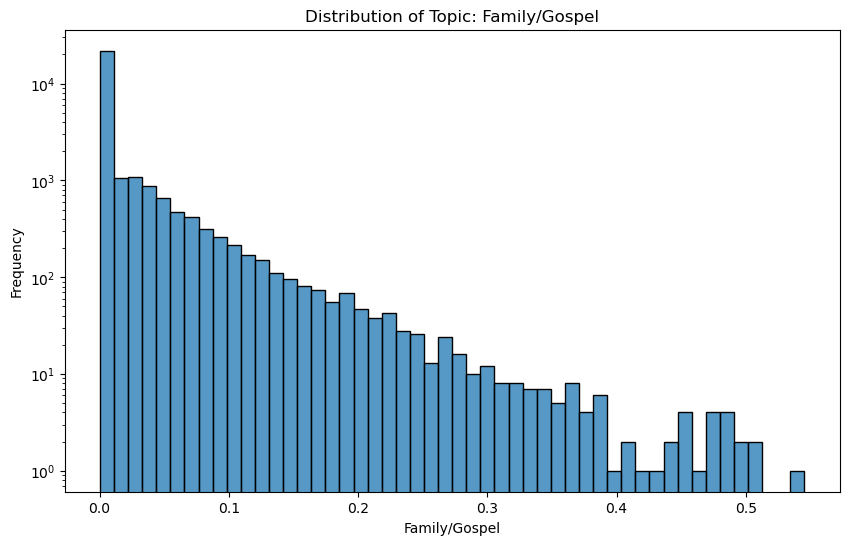

In [24]:
plt.figure(figsize=(10, 6))
sns.histplot(df["family/gospel"], bins=50, kde=False)
plt.title("Distribution of Topic: Family/Gospel")
plt.xlabel("Family/Gospel")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

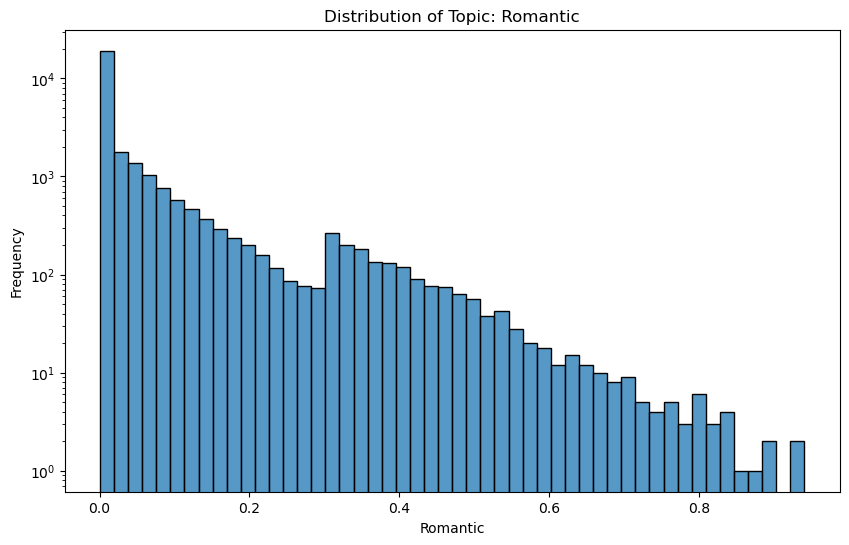

In [25]:
plt.figure(figsize=(10, 6))
sns.histplot(df["romantic"], bins=50, kde=False)
plt.title("Distribution of Topic: Romantic")
plt.xlabel("Romantic")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

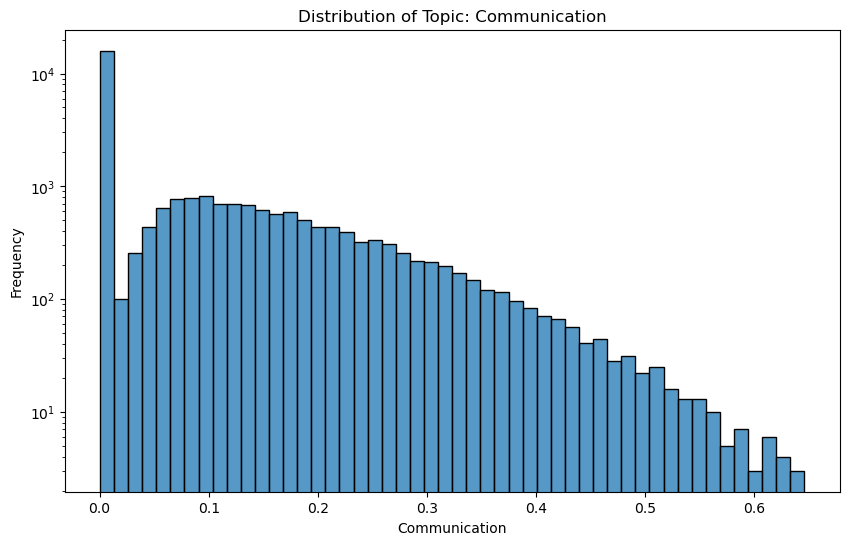

In [26]:
plt.figure(figsize=(10, 6))
sns.histplot(df["communication"], bins=50, kde=False)
plt.title("Distribution of Topic: Communication")
plt.xlabel("Communication")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

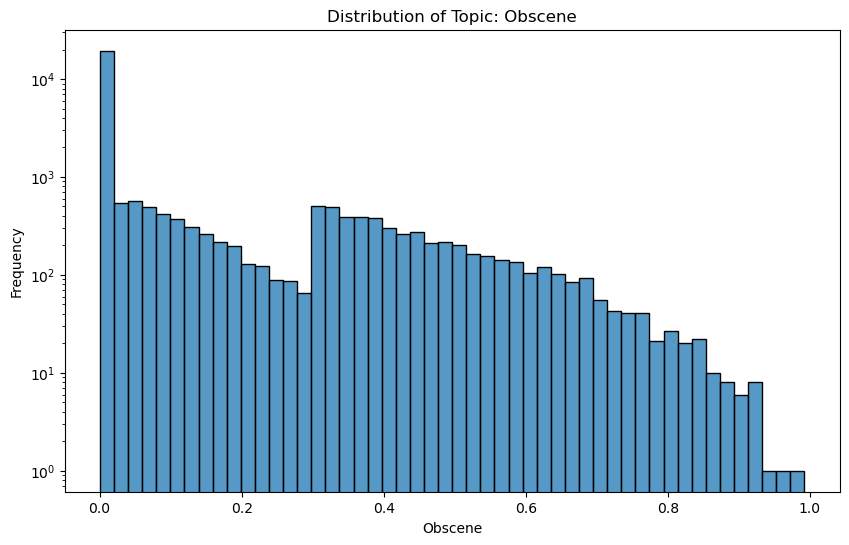

In [27]:
plt.figure(figsize=(10, 6))
sns.histplot(df["obscene"], bins=50, kde=False)
plt.title("Distribution of Topic: Obscene")
plt.xlabel("Obscene")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

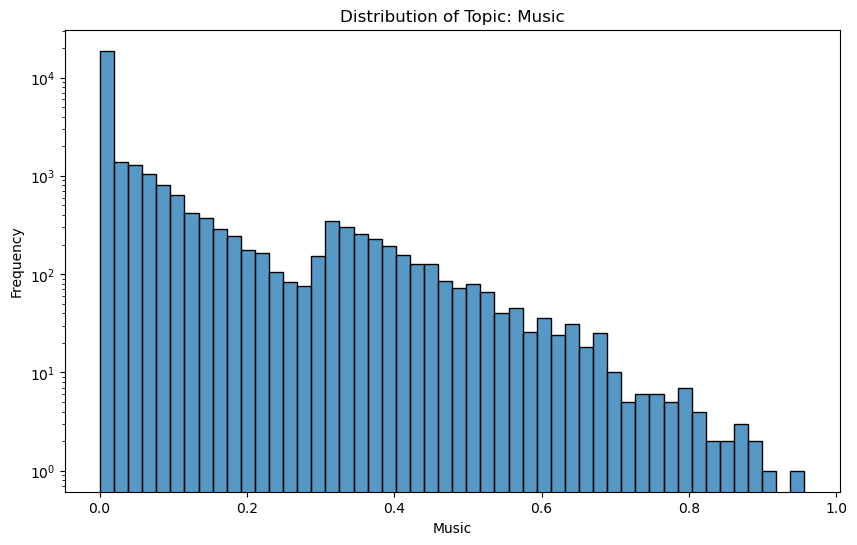

In [28]:
plt.figure(figsize=(10, 6))
sns.histplot(df["music"], bins=50, kde=False)
plt.title("Distribution of Topic: Music")
plt.xlabel("Music")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

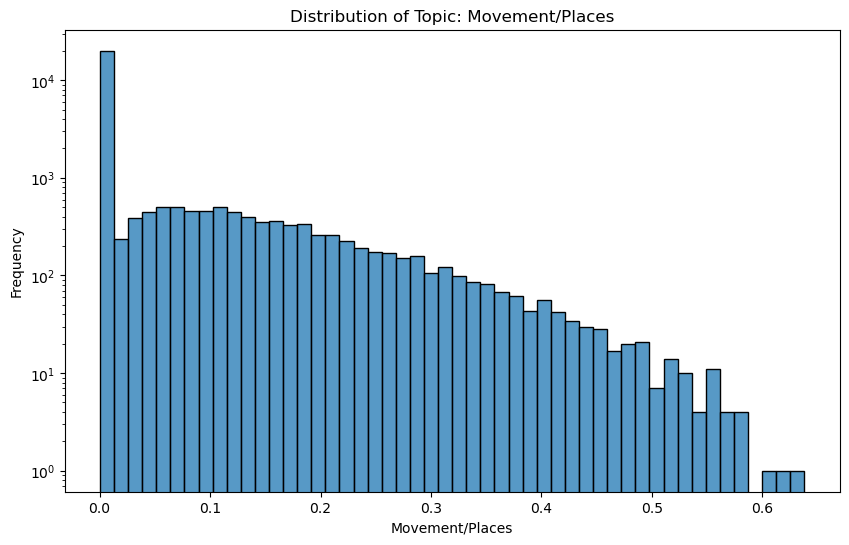

In [29]:
plt.figure(figsize=(10, 6))
sns.histplot(df["movement/places"], bins=50, kde=False)
plt.title("Distribution of Topic: Movement/Places")
plt.xlabel("Movement/Places")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

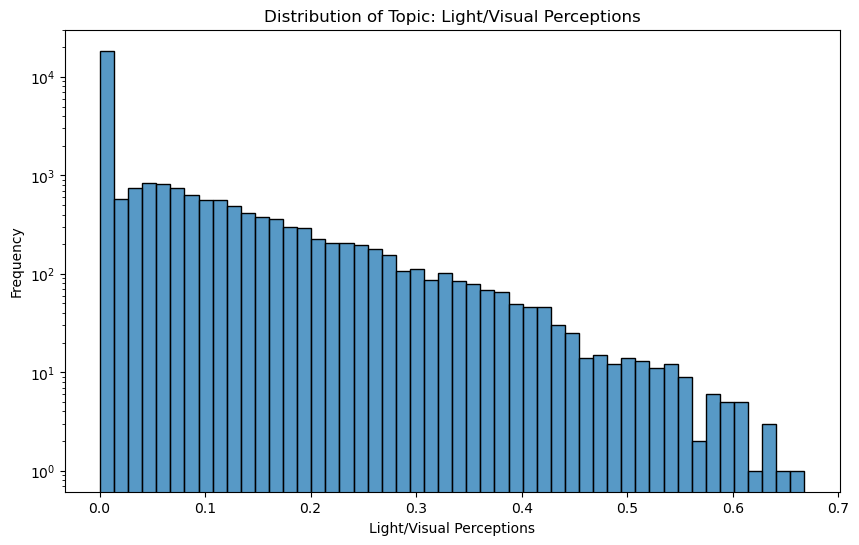

In [30]:
plt.figure(figsize=(10, 6))
sns.histplot(df["light/visual perceptions"], bins=50, kde=False)
plt.title("Distribution of Topic: Light/Visual Perceptions")
plt.xlabel("Light/Visual Perceptions")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

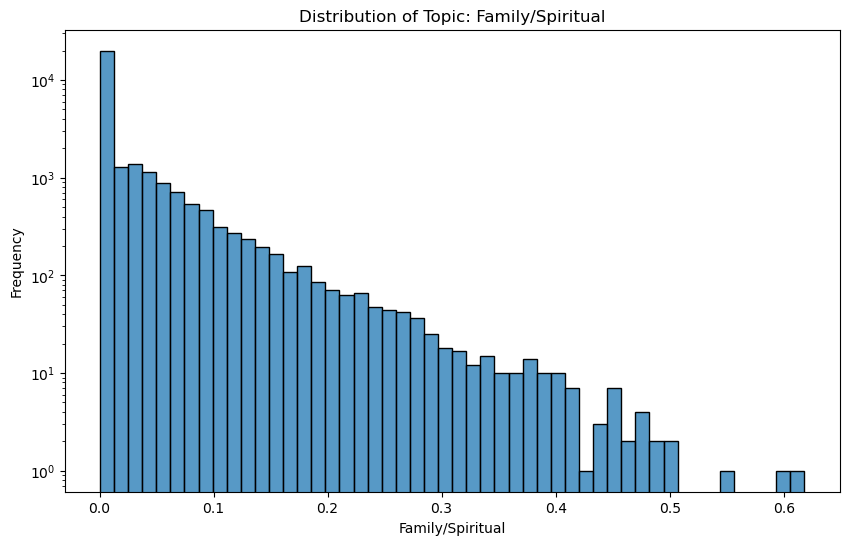

In [31]:
plt.figure(figsize=(10, 6))
sns.histplot(df["family/spiritual"], bins=50, kde=False)
plt.title("Distribution of Topic: Family/Spiritual")
plt.xlabel("Family/Spiritual")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

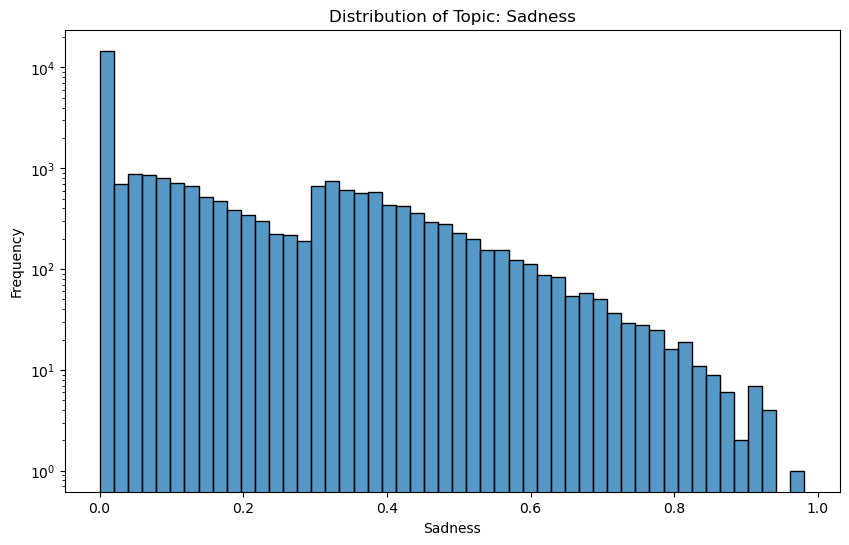

In [32]:
plt.figure(figsize=(10, 6))
sns.histplot(df["sadness"], bins=50, kde=False)
plt.title("Distribution of Topic: Sadness")
plt.xlabel("Sadness")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

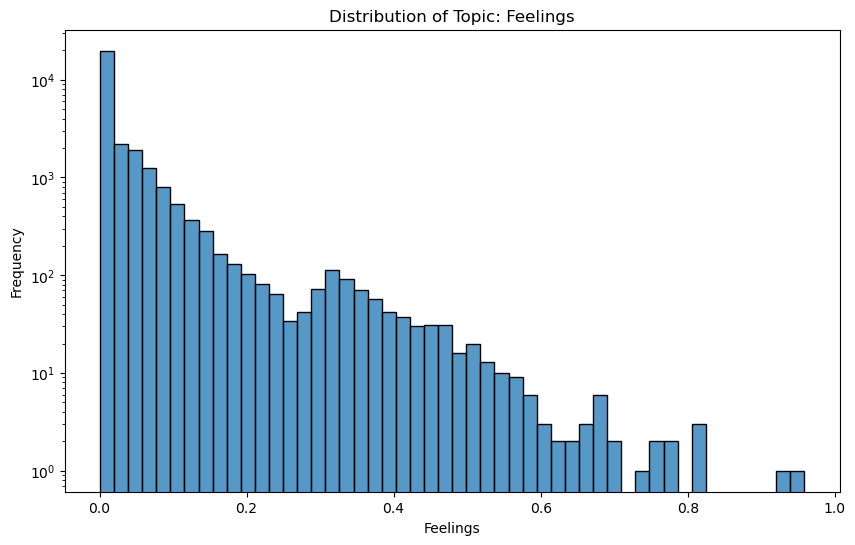

In [33]:
plt.figure(figsize=(10, 6))
sns.histplot(df["feelings"], bins=50, kde=False)
plt.title("Distribution of Topic: Feelings")
plt.xlabel("Feelings")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

all the histograms are right skewed, large spike at/near 0
dist a: dating  shake the audience  family/gospel   family/spiritual
     1: communication   movement/places     light/visual perceptions
  decreasing diagonally
    slight increase at the start
dist b: violence    world/life  night/time  romantic
        obscene     music     sadness   feelings
  diagonal descrease, then a spike, then another diagonal decrease

distribution a aligns with topics between 0 and .70
distribution b aligns with topics between 0 and 1

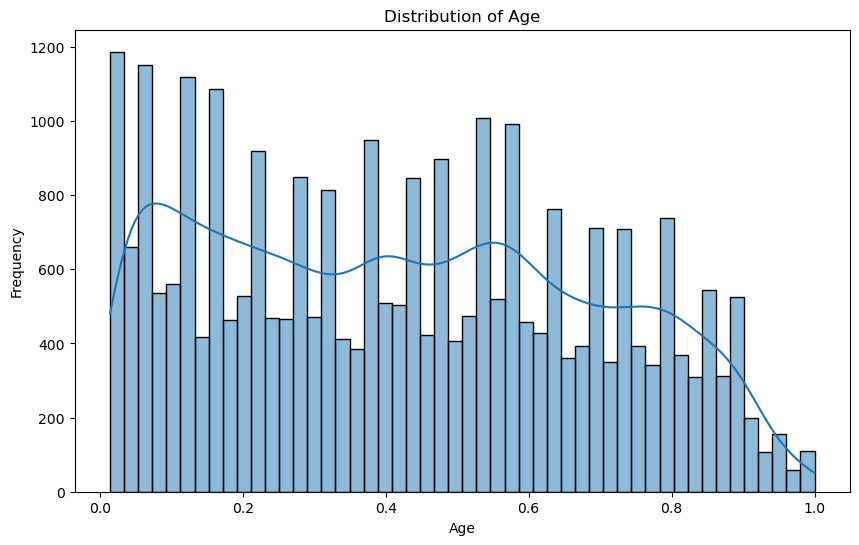

In [13]:
plt.figure(figsize=(10, 6))
sns.histplot(df["age"], bins=50, kde=True)
plt.title("Distribution of Age")
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.show()

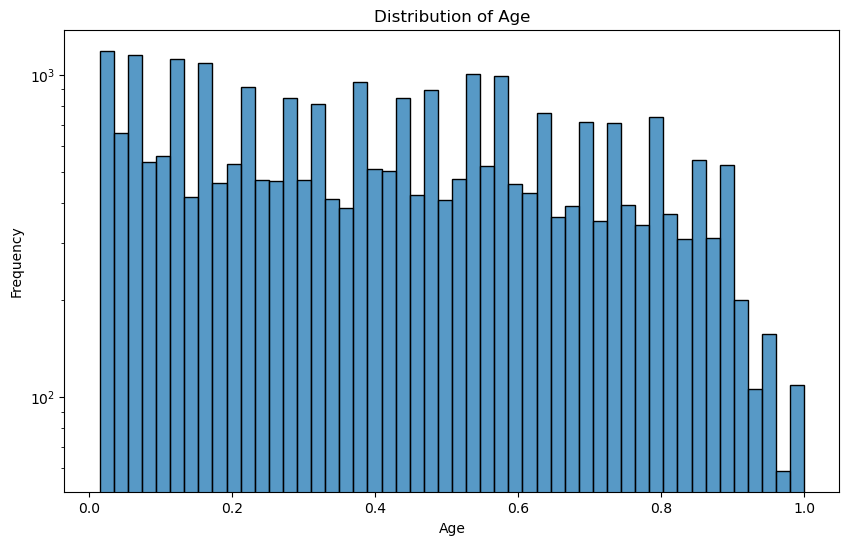

In [44]:
plt.figure(figsize=(10, 6))
sns.histplot(df["age"], bins=50)
plt.title("Distribution of Age")
plt.xlabel("Age")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

### Categorical Data

In [57]:
num_songs = df.groupby("artist_name")[["track_name"]].count()
num_songs.sort_values(by="track_name")

,track_name
artist_name,
彭家麗,1
planta e raiz,1
frida,1
planet asia & peanut butter wolf,1
fu-schnickens,1
...,...
george jones,107
willie nelson,131
dean martin,146


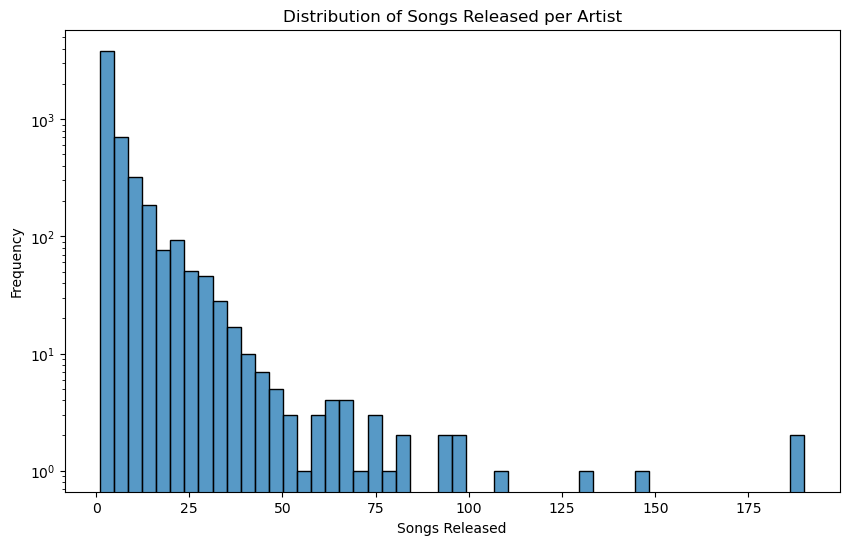

In [63]:
plt.figure(figsize=(10, 6))
sns.histplot(num_songs["track_name"], bins=50)
plt.title("Distribution of Songs Released per Artist")
plt.xlabel("Songs Released")
plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

right skewed => most artists usually only release a handful of songs
harder to recommend for artists with very few songs

In [67]:
non_unique_title = df.groupby("track_name")[["artist_name"]].count()
non_unique_title[non_unique_title["artist_name"] > 1]

,artist_name
track_name,
'round midnight,2
(ghost) riders in the sky,6
(hey won't you play) another somebody done somebody wrong song,2
(i can't get no) satisfaction,2
(i don't have) anymore love songs,2
...,...
your way,2
yours,4
youth,2


some are cover songs, some are different songs with same title
cover songs should be more easily recommended to each other => higher similarity of words

counts for: unique artist names, non-unique track_name, unique words used in a song
        are artists with more songs more likely to be recommended?
        how similar are two songs with the same? likely to be recommended?
groupbys:   artist_name, genre, release_date, topic
    artist_name in genre, genre in artist_name, release_date in genre, genre in release date, topic in genre, genre in topic, topic in release_date, release_date in topic

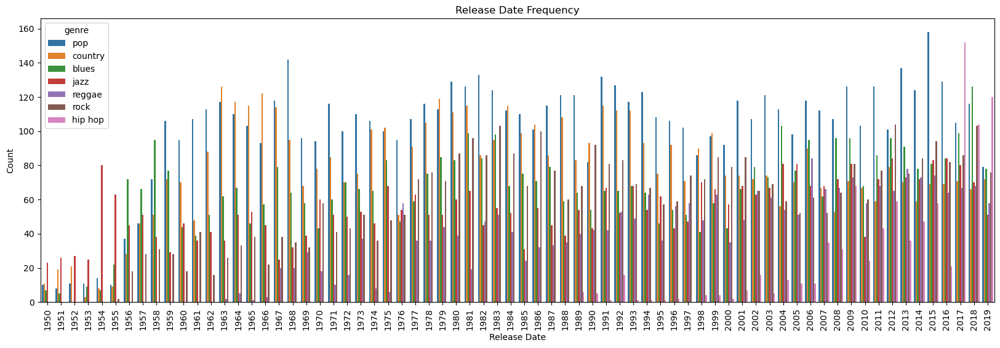

In [39]:
plt.figure(figsize=(20, 6))
sns.countplot(x="release_date", data=df, hue="genre")
plt.title("Release Date Frequency")
plt.xlabel("Release Date")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.show()

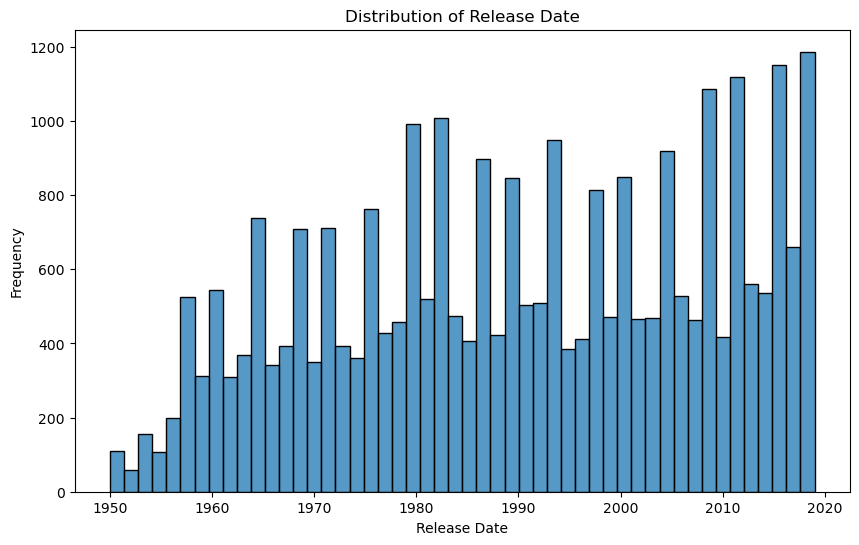

In [43]:
plt.figure(figsize=(10, 6))
sns.histplot(df["release_date"], bins=50, kde=False)
plt.title("Distribution of Release Date")
plt.xlabel("Release Date")
# plt.yscale("log")
plt.ylabel("Frequency")
plt.show()

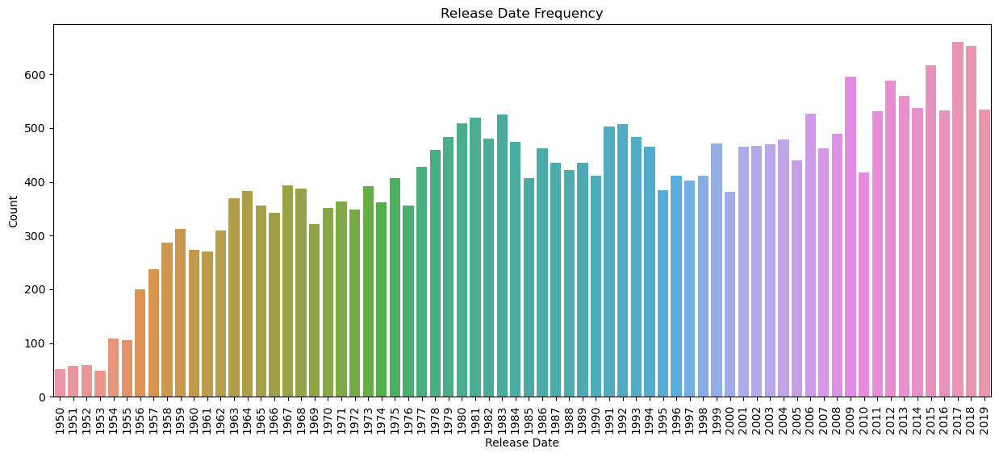

In [47]:
plt.figure(figsize=(15, 6))
sns.countplot(x="release_date", data=df)
plt.title("Release Date Frequency")
plt.xlabel("Release Date")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.show()

left skewed => there are always going to be newer songs being made, technology for recording and distributing music improves drastically
can the small spikes/peaks be attributed to major events around the time, even if the songs themselves aren't about the major event(s)
    for ex. the band my chemical romance formed as a result of 9/11

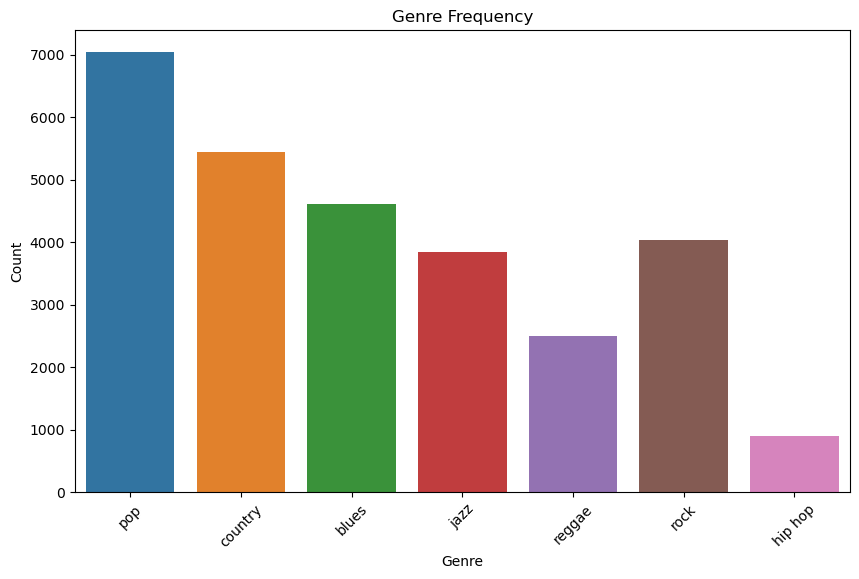

In [40]:
plt.figure(figsize=(10, 6))
sns.countplot(x="genre", data=df)
plt.title("Genre Frequency")
plt.xlabel("Genre")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.show()

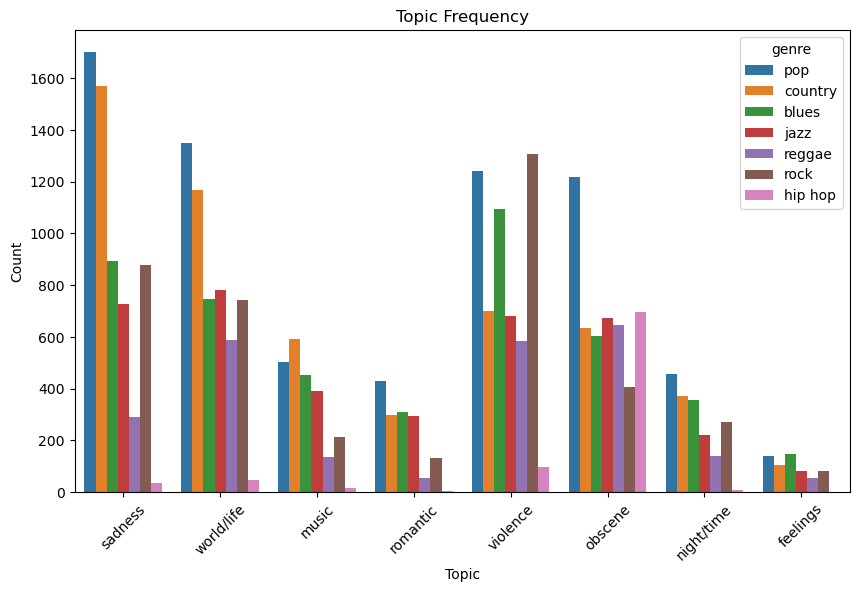

In [45]:
plt.figure(figsize=(10, 6))
sns.countplot(x="topic", data=df, hue="genre")
plt.title("Topic Frequency")
plt.xlabel("Topic")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.show()

only 8 of the topic columns show up, the ones missing are: dating, shake the audience, family/gospel, communication, movement/places, light/visual perceptions, family/spiritual (the less than .7)

could these show up as topic #2, would that be helpful for analysis
is the topic column even necesary for modelling, or could we just use the raw numbers

## Bivariate Analysis

counts for: unique artist names, non-unique track_name, unique words used in a song
        are artists with more songs more likely to be recommended?
        how similar are two songs with the same? likely to be recommended?
groupbys:   artist_name, genre, release_date, topic
    artist_name in genre, genre in artist_name, release_date in genre, genre in release date, topic in genre, genre in topic, topic in release_date, release_date in topic

don't have a target variable in df, so just compare all values to each other

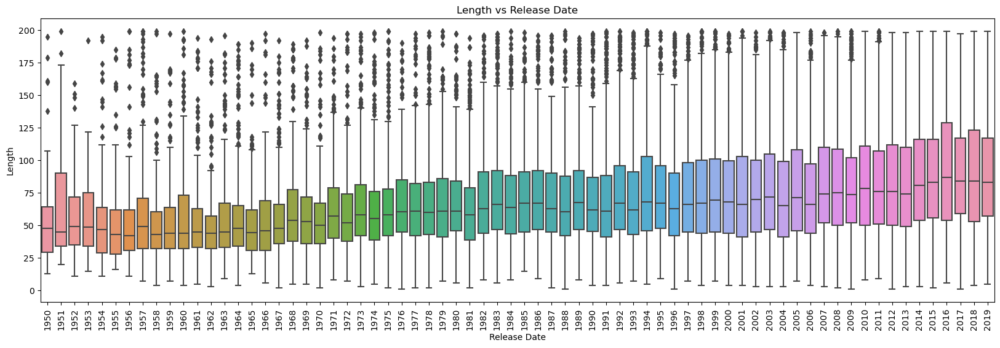

In [69]:
# quantitative vs categorical
# release_date vs ___

plt.figure(figsize=(20, 6))
sns.boxplot(data=df, x="release_date", y="len")
plt.title("Length vs Release Date")
plt.xlabel("Release Date")
# plt.yscale("log")
plt.ylabel("Length")
plt.xticks(rotation=90)
plt.show()

newer songs on average are longer than older songs

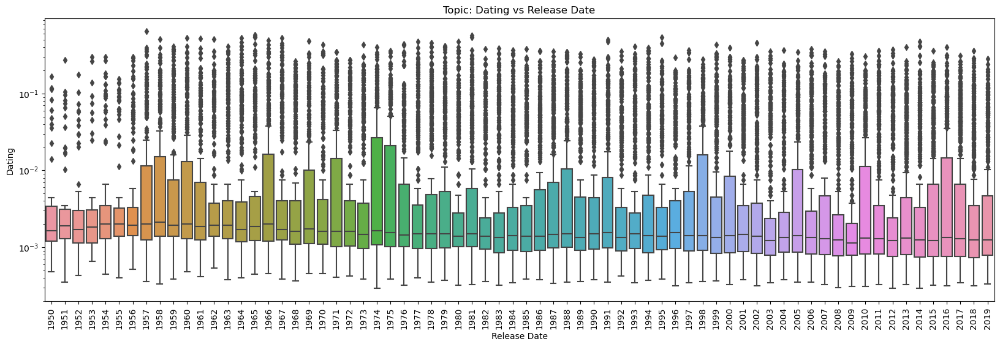

In [71]:
plt.figure(figsize=(20, 6))
sns.boxplot(data=df, x="release_date", y="dating")
plt.title("Topic: Dating vs Release Date")
plt.xlabel("Release Date")
plt.yscale("log")
plt.ylabel("Dating")
plt.xticks(rotation=90)
plt.show()

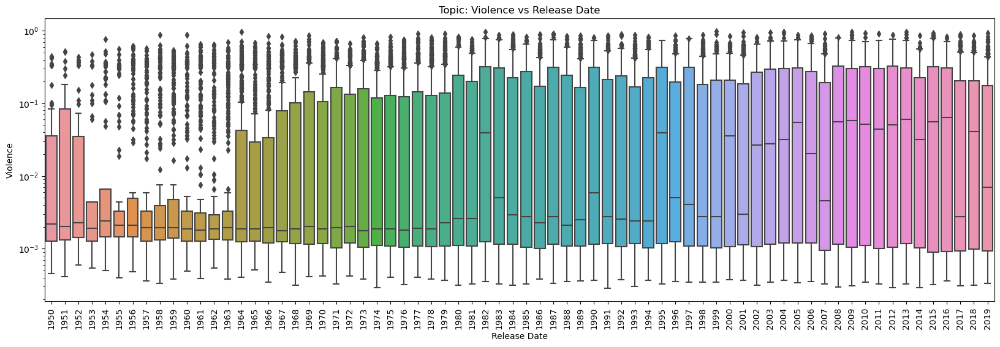

In [72]:
plt.figure(figsize=(20, 6))
sns.boxplot(data=df, x="release_date", y="violence")
plt.title("Topic: Violence vs Release Date")
plt.xlabel("Release Date")
plt.yscale("log")
plt.ylabel("Violence")
plt.xticks(rotation=90)
plt.show()

range for the boxplot is significantly smaller for 1953-1963

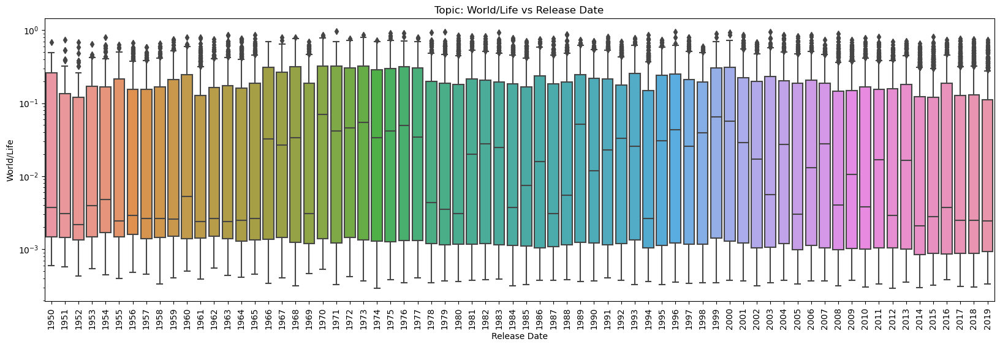

In [73]:
plt.figure(figsize=(20, 6))
sns.boxplot(data=df, x="release_date", y="world/life")
plt.title("Topic: World/Life vs Release Date")
plt.xlabel("Release Date")
plt.yscale("log")
plt.ylabel("World/Life")
plt.xticks(rotation=90)
plt.show()

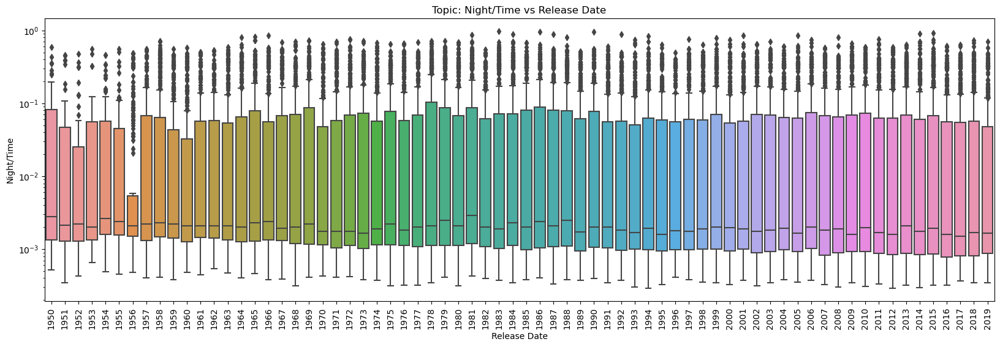

In [74]:
plt.figure(figsize=(20, 6))
sns.boxplot(data=df, x="release_date", y="night/time")
plt.title("Topic: Night/Time vs Release Date")
plt.xlabel("Release Date")
plt.yscale("log")
plt.ylabel("Night/Time")
plt.xticks(rotation=90)
plt.show()

1956 is weird???

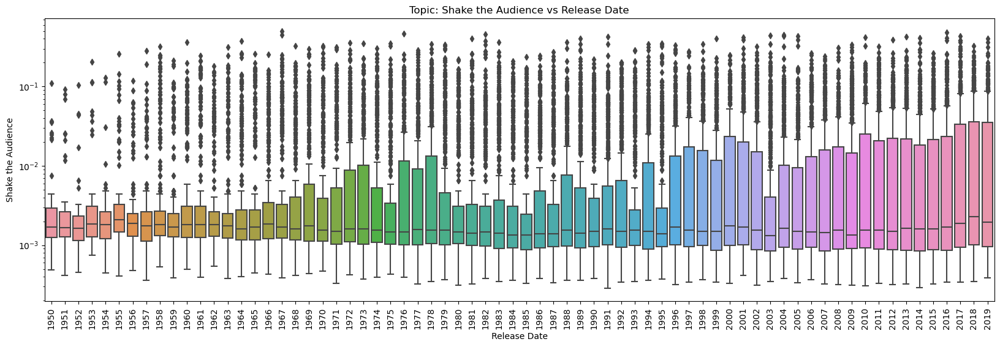

In [75]:
plt.figure(figsize=(20, 6))
sns.boxplot(data=df, x="release_date", y="shake the audience")
plt.title("Topic: Shake the Audience vs Release Date")
plt.xlabel("Release Date")
plt.yscale("log")
plt.ylabel("Shake the Audience")
plt.xticks(rotation=90)
plt.show()

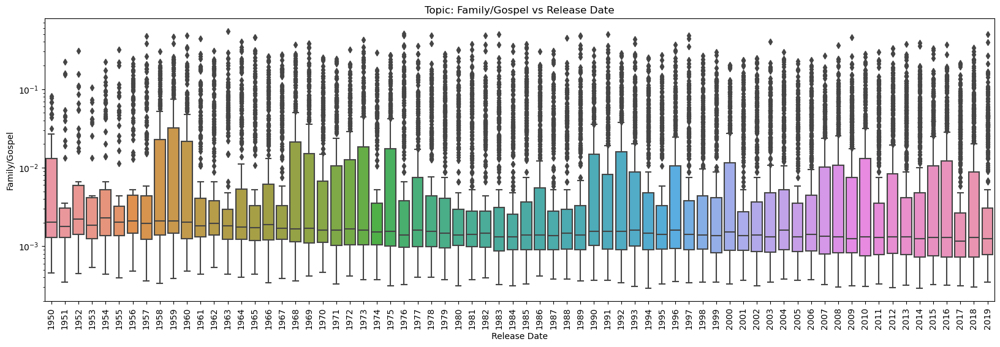

In [76]:
plt.figure(figsize=(20, 6))
sns.boxplot(data=df, x="release_date", y="family/gospel")
plt.title("Topic: Family/Gospel vs Release Date")
plt.xlabel("Release Date")
plt.yscale("log")
plt.ylabel("Family/Gospel")
plt.xticks(rotation=90)
plt.show()

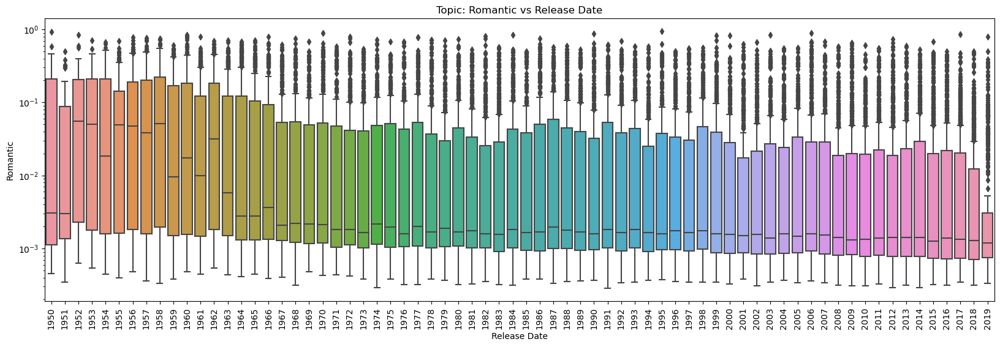

In [77]:
plt.figure(figsize=(20, 6))
sns.boxplot(data=df, x="release_date", y="romantic")
plt.title("Topic: Romantic vs Release Date")
plt.xlabel("Release Date")
plt.yscale("log")
plt.ylabel("Romantic")
plt.xticks(rotation=90)
plt.show()

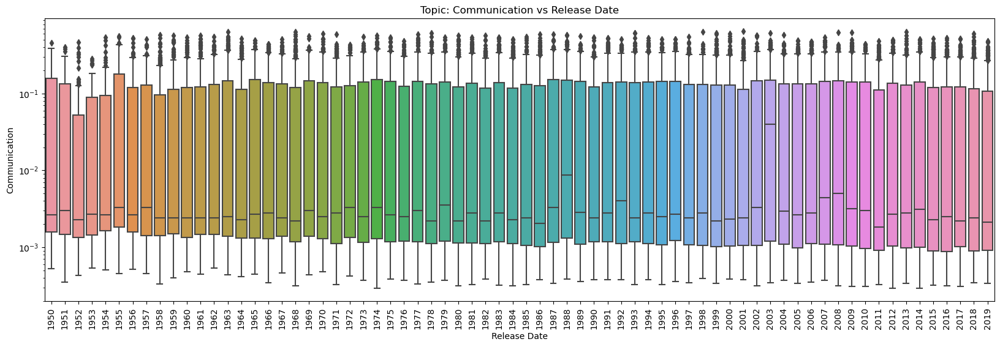

In [78]:
plt.figure(figsize=(20, 6))
sns.boxplot(data=df, x="release_date", y="communication")
plt.title("Topic: Communication vs Release Date")
plt.xlabel("Release Date")
plt.yscale("log")
plt.ylabel("Communication")
plt.xticks(rotation=90)
plt.show()

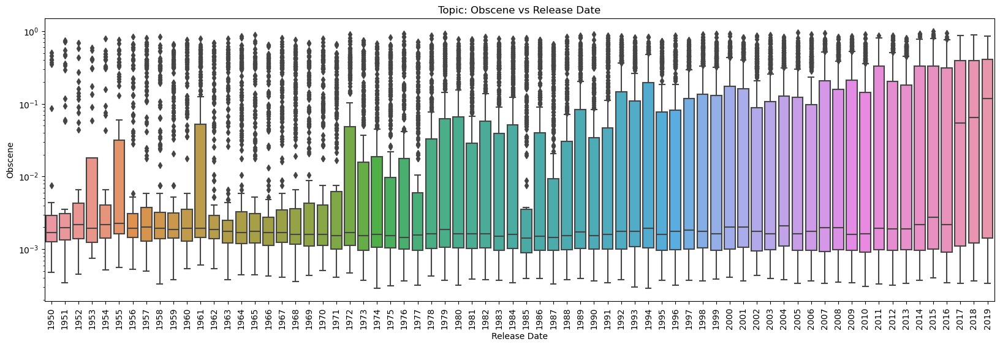

In [79]:
plt.figure(figsize=(20, 6))
sns.boxplot(data=df, x="release_date", y="obscene")
plt.title("Topic: Obscene vs Release Date")
plt.xlabel("Release Date")
plt.yscale("log")
plt.ylabel("Obscene")
plt.xticks(rotation=90)
plt.show()

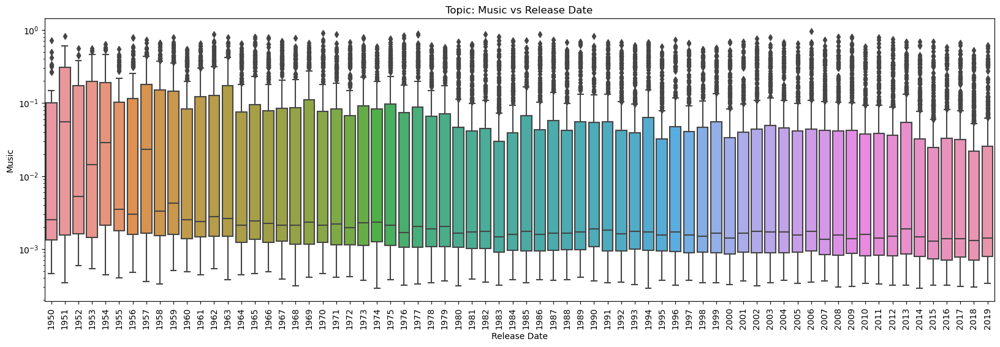

In [80]:
plt.figure(figsize=(20, 6))
sns.boxplot(data=df, x="release_date", y="music")
plt.title("Topic: Music vs Release Date")
plt.xlabel("Release Date")
plt.yscale("log")
plt.ylabel("Music")
plt.xticks(rotation=90)
plt.show()

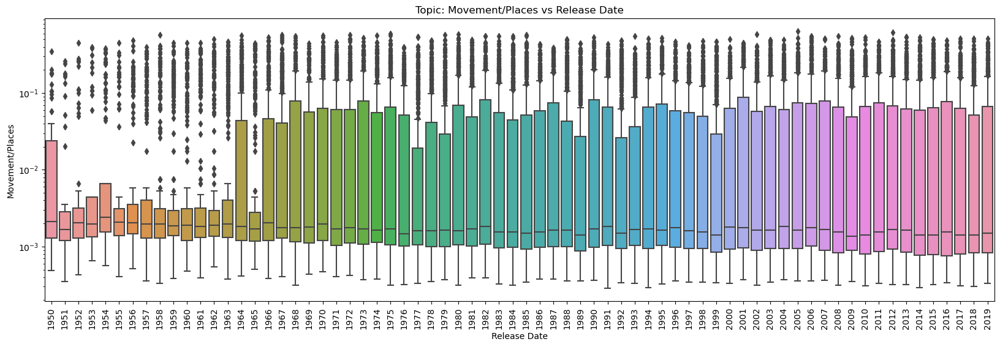

In [81]:
plt.figure(figsize=(20, 6))
sns.boxplot(data=df, x="release_date", y="movement/places")
plt.title("Topic: Movement/Places vs Release Date")
plt.xlabel("Release Date")
plt.yscale("log")
plt.ylabel("Movement/Places")
plt.xticks(rotation=90)
plt.show()

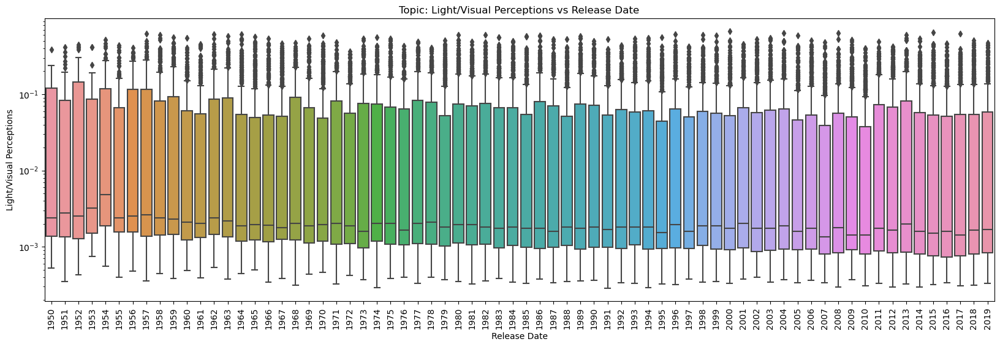

In [82]:
plt.figure(figsize=(20, 6))
sns.boxplot(data=df, x="release_date", y="light/visual perceptions")
plt.title("Topic: Light/Visual Perceptions vs Release Date")
plt.xlabel("Release Date")
plt.yscale("log")
plt.ylabel("Light/Visual Perceptions")
plt.xticks(rotation=90)
plt.show()

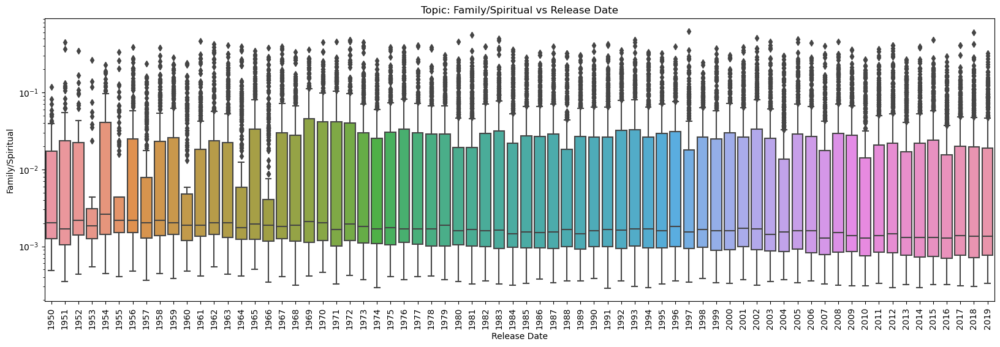

In [83]:
plt.figure(figsize=(20, 6))
sns.boxplot(data=df, x="release_date", y="family/spiritual")
plt.title("Topic: Family/Spiritual vs Release Date")
plt.xlabel("Release Date")
plt.yscale("log")
plt.ylabel("Family/Spiritual")
plt.xticks(rotation=90)
plt.show()

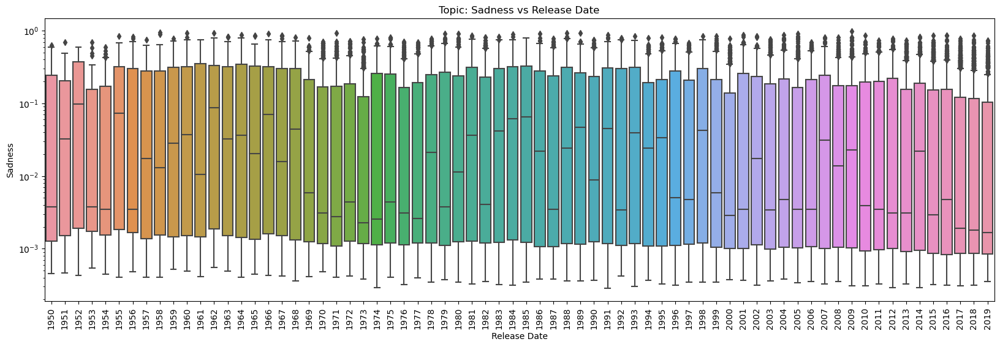

In [84]:
plt.figure(figsize=(20, 6))
sns.boxplot(data=df, x="release_date", y="sadness")
plt.title("Topic: Sadness vs Release Date")
plt.xlabel("Release Date")
plt.yscale("log")
plt.ylabel("Sadness")
plt.xticks(rotation=90)
plt.show()

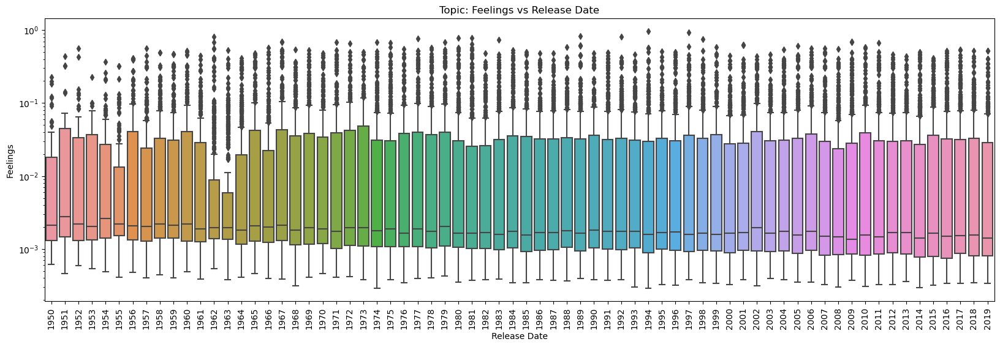

In [85]:
plt.figure(figsize=(20, 6))
sns.boxplot(data=df, x="release_date", y="feelings")
plt.title("Topic: Feelings vs Release Date")
plt.xlabel("Release Date")
plt.yscale("log")
plt.ylabel("Feelings")
plt.xticks(rotation=90)
plt.show()

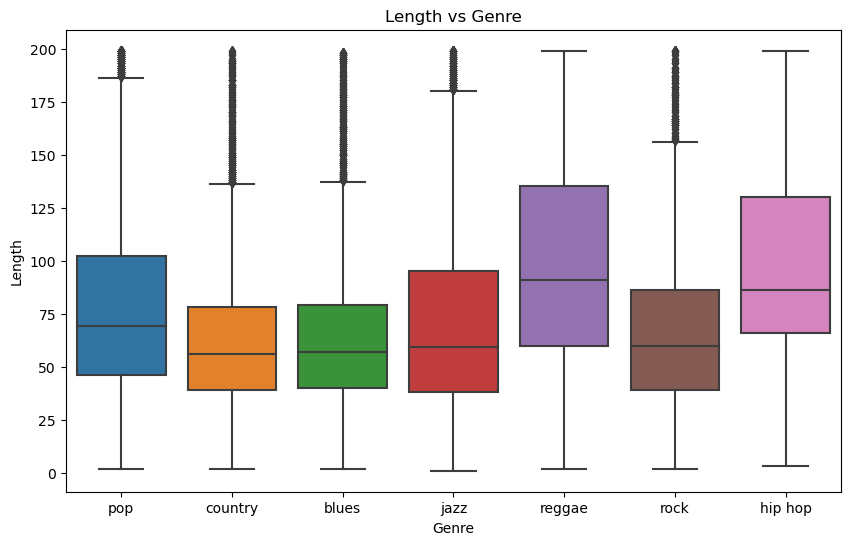

In [87]:
# genre vs ___

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="genre", y="len")
plt.title("Length vs Genre")
plt.xlabel("Genre")
# plt.yscale("log")
plt.ylabel("Length")
plt.xticks(rotation=0)
plt.show()

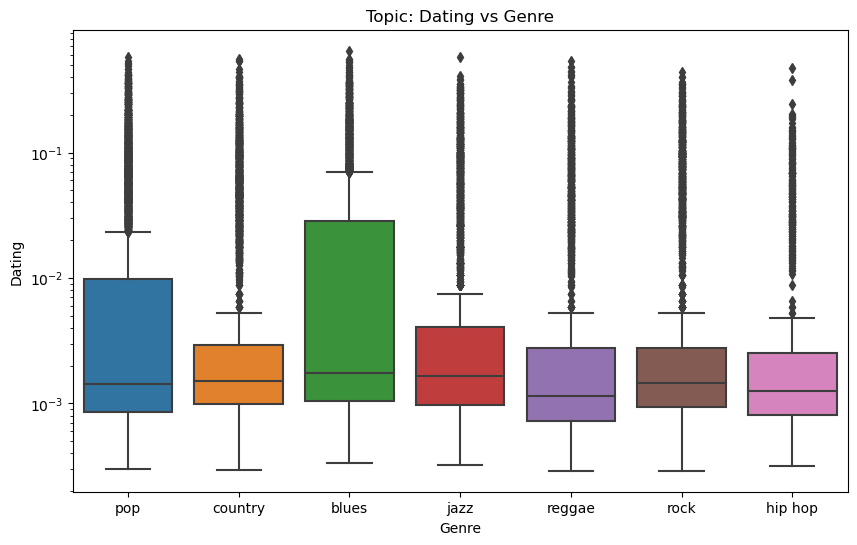

In [89]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="genre", y="dating")
plt.title("Topic: Dating vs Genre")
plt.xlabel("Genre")
plt.yscale("log")
plt.ylabel("Dating")
plt.xticks(rotation=0)
plt.show()

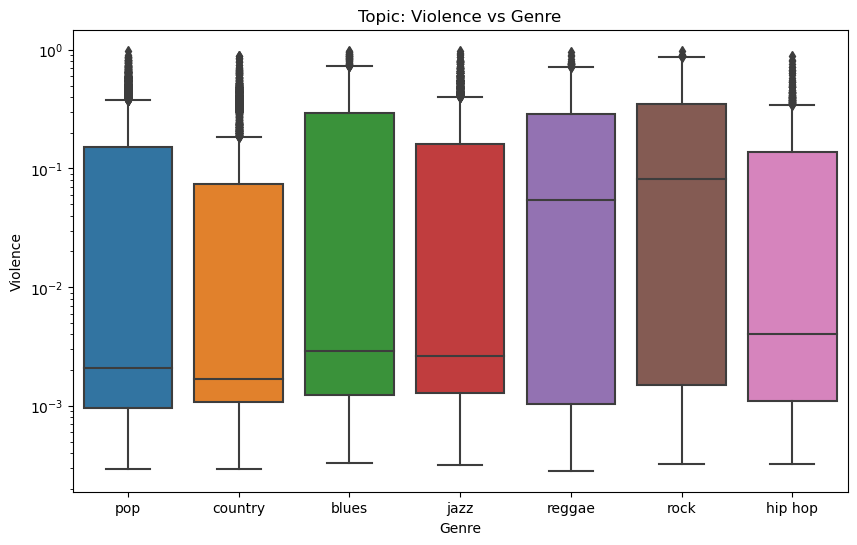

In [95]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="genre", y="violence")
plt.title("Topic: Violence vs Genre")
plt.xlabel("Genre")
plt.yscale("log")
plt.ylabel("Violence")
plt.xticks(rotation=0)
plt.show()

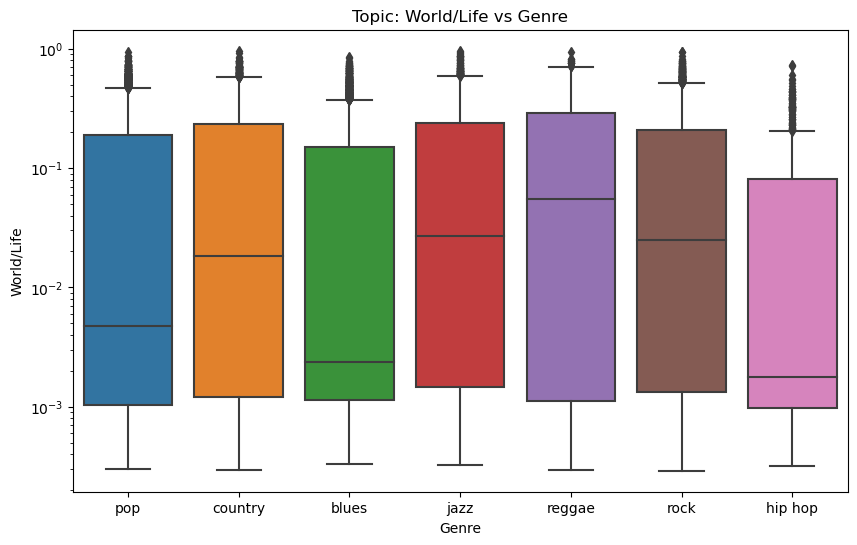

In [96]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="genre", y="world/life")
plt.title("Topic: World/Life vs Genre")
plt.xlabel("Genre")
plt.yscale("log")
plt.ylabel("World/Life")
plt.xticks(rotation=0)
plt.show()

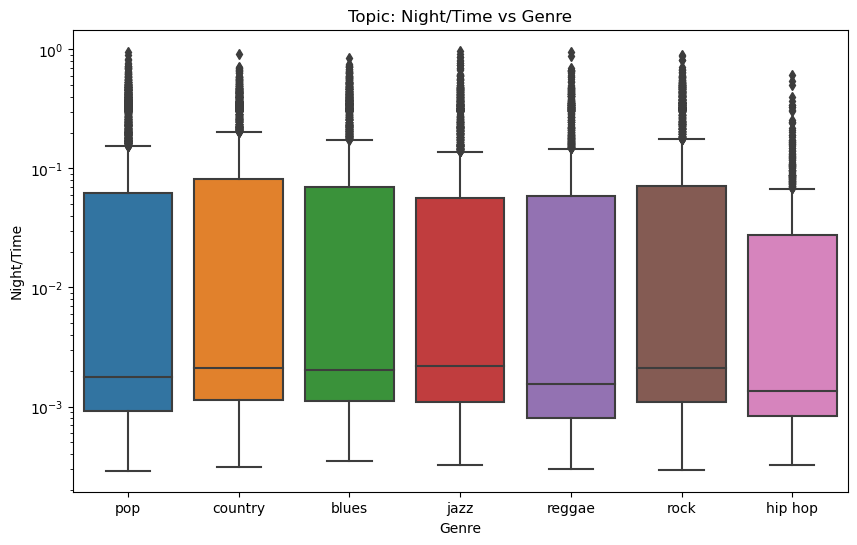

In [97]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="genre", y="night/time")
plt.title("Topic: Night/Time vs Genre")
plt.xlabel("Genre")
plt.yscale("log")
plt.ylabel("Night/Time")
plt.xticks(rotation=0)
plt.show()

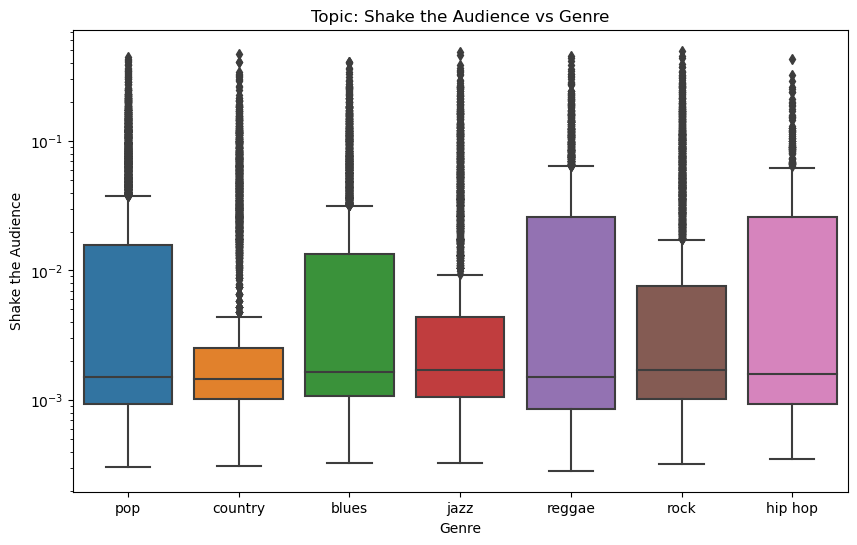

In [98]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="genre", y="shake the audience")
plt.title("Topic: Shake the Audience vs Genre")
plt.xlabel("Genre")
plt.yscale("log")
plt.ylabel("Shake the Audience")
plt.xticks(rotation=0)
plt.show()

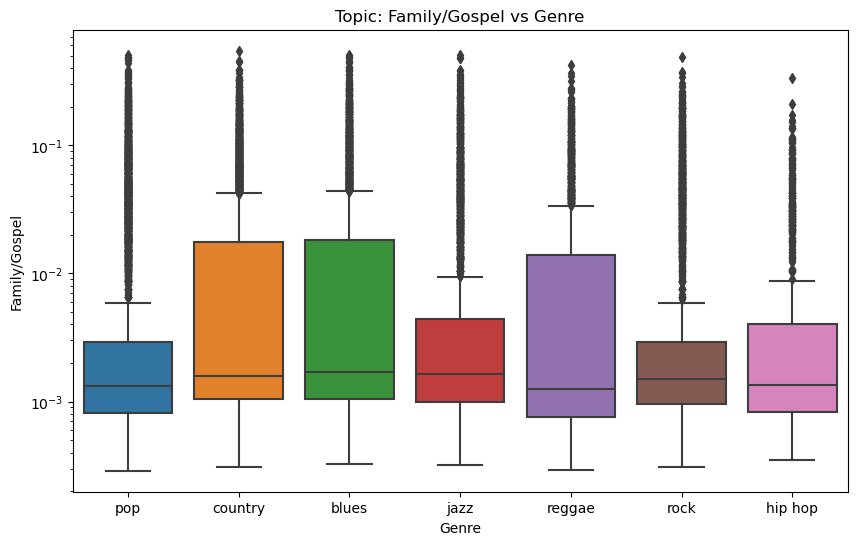

In [99]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="genre", y="family/gospel")
plt.title("Topic: Family/Gospel vs Genre")
plt.xlabel("Genre")
plt.yscale("log")
plt.ylabel("Family/Gospel")
plt.xticks(rotation=0)
plt.show()

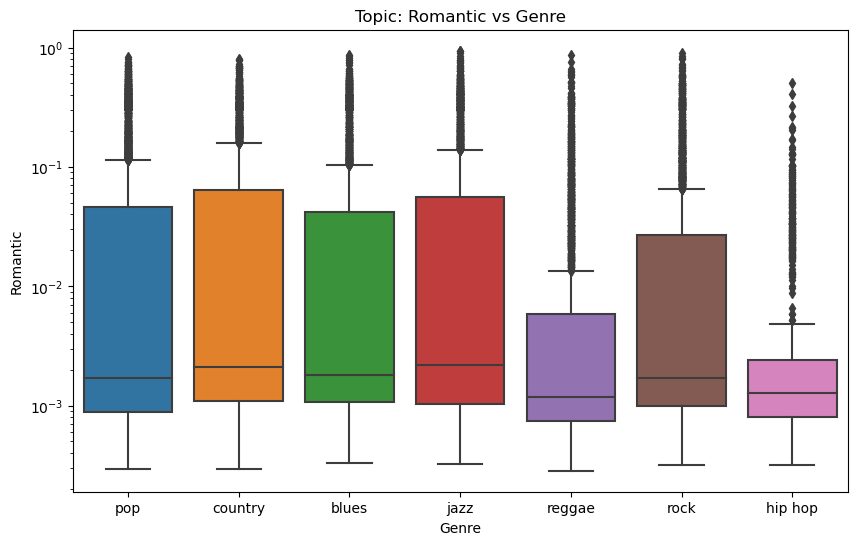

In [100]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="genre", y="romantic")
plt.title("Topic: Romantic vs Genre")
plt.xlabel("Genre")
plt.yscale("log")
plt.ylabel("Romantic")
plt.xticks(rotation=0)
plt.show()

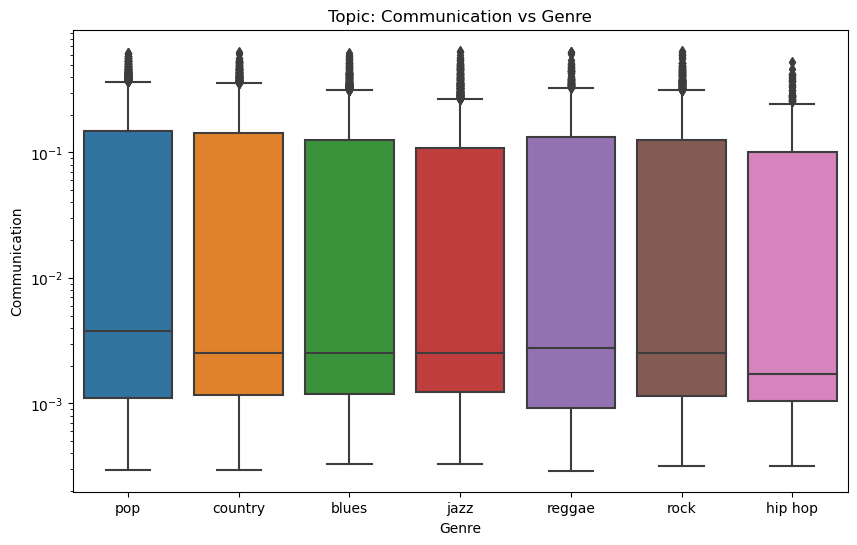

In [102]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="genre", y="communication")
plt.title("Topic: Communication vs Genre")
plt.xlabel("Genre")
plt.yscale("log")
plt.ylabel("Communication")
plt.xticks(rotation=0)
plt.show()

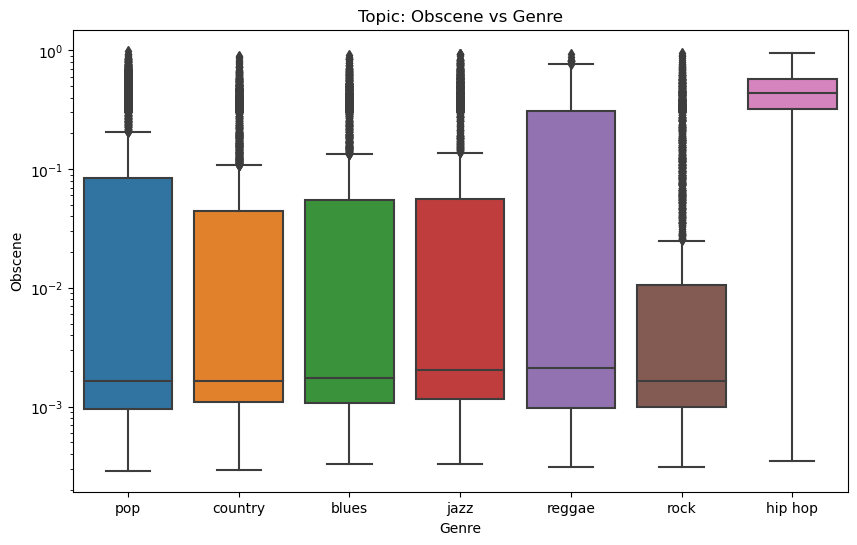

In [101]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="genre", y="obscene")
plt.title("Topic: Obscene vs Genre")
plt.xlabel("Genre")
plt.yscale("log")
plt.ylabel("Obscene")
plt.xticks(rotation=0)
plt.show()

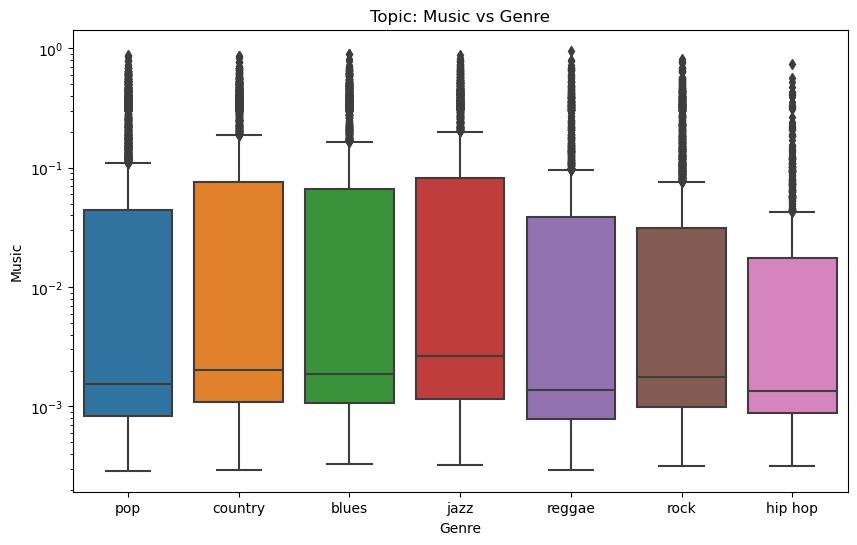

In [103]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="genre", y="music")
plt.title("Topic: Music vs Genre")
plt.xlabel("Genre")
plt.yscale("log")
plt.ylabel("Music")
plt.xticks(rotation=0)
plt.show()

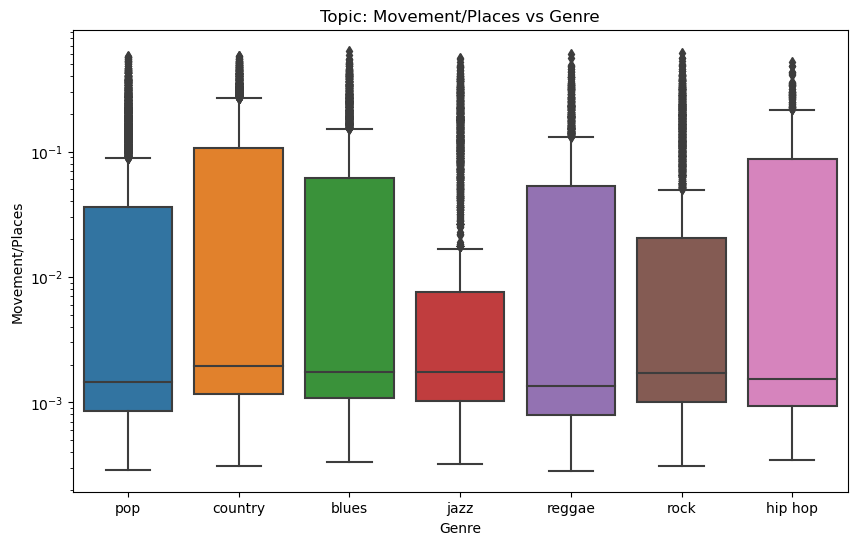

In [104]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="genre", y="movement/places")
plt.title("Topic: Movement/Places vs Genre")
plt.xlabel("Genre")
plt.yscale("log")
plt.ylabel("Movement/Places")
plt.xticks(rotation=0)
plt.show()

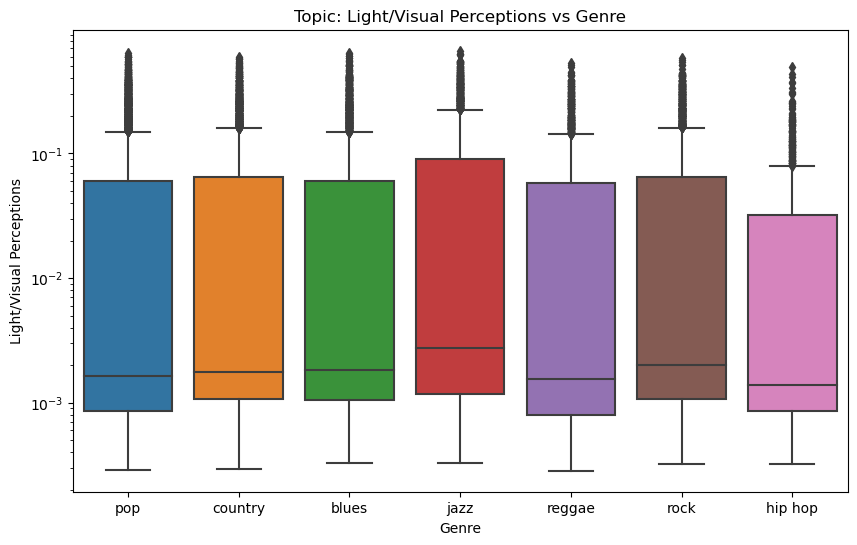

In [105]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="genre", y="light/visual perceptions")
plt.title("Topic: Light/Visual Perceptions vs Genre")
plt.xlabel("Genre")
plt.yscale("log")
plt.ylabel("Light/Visual Perceptions")
plt.xticks(rotation=0)
plt.show()

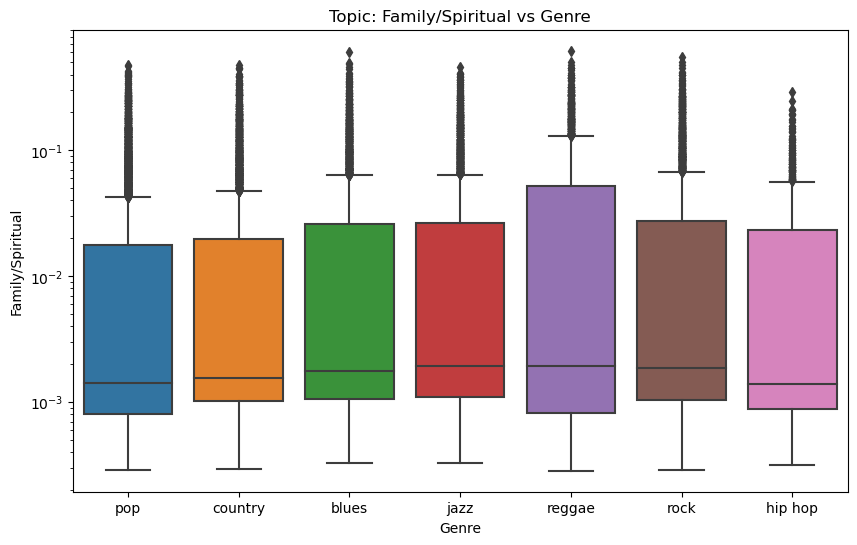

In [106]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="genre", y="family/spiritual")
plt.title("Topic: Family/Spiritual vs Genre")
plt.xlabel("Genre")
plt.yscale("log")
plt.ylabel("Family/Spiritual")
plt.xticks(rotation=0)
plt.show()

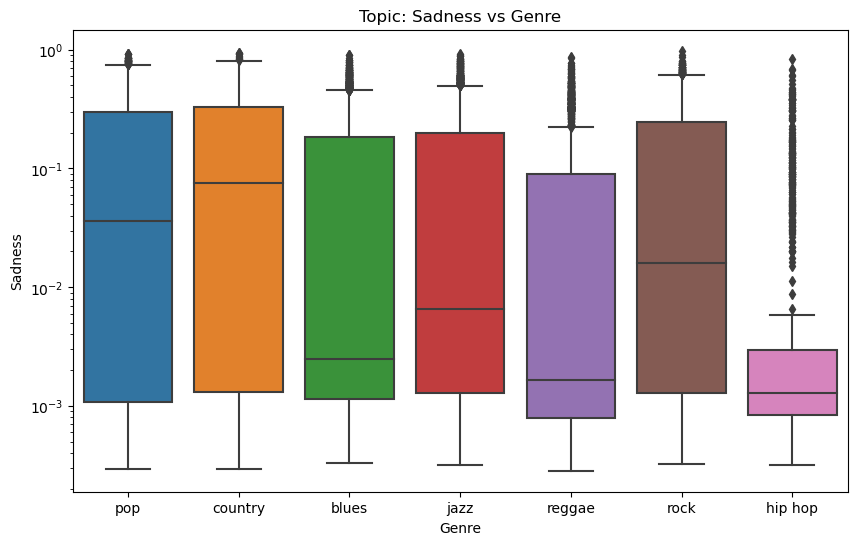

In [107]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="genre", y="sadness")
plt.title("Topic: Sadness vs Genre")
plt.xlabel("Genre")
plt.yscale("log")
plt.ylabel("Sadness")
plt.xticks(rotation=0)
plt.show()

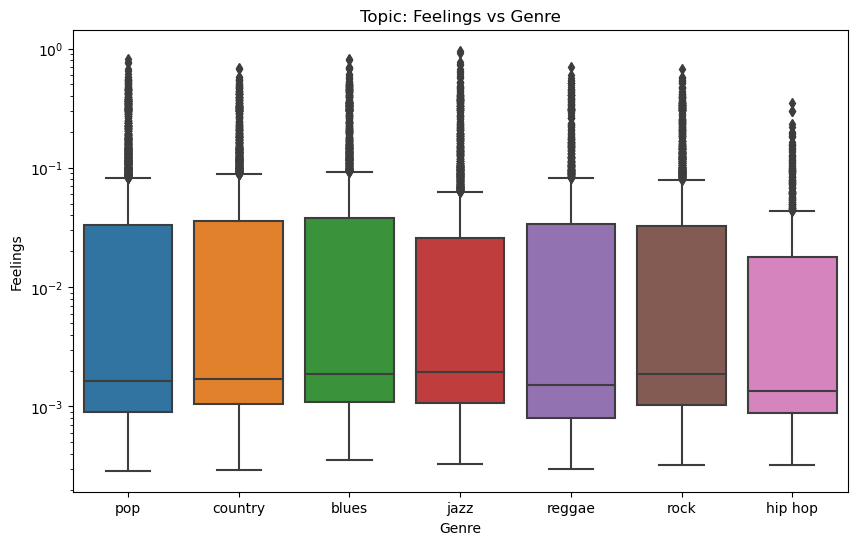

In [108]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="genre", y="feelings")
plt.title("Topic: Feelings vs Genre")
plt.xlabel("Genre")
plt.yscale("log")
plt.ylabel("Feelings")
plt.xticks(rotation=0)
plt.show()

len vs __??
topic vs __

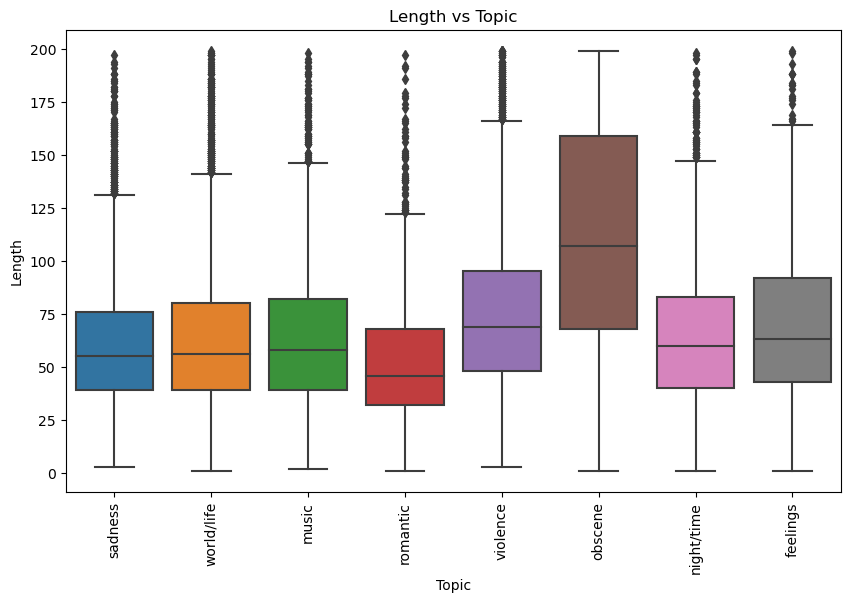

In [110]:
# topic vs ___

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="topic", y="len")
plt.title("Length vs Topic")
plt.xlabel("Topic")
# plt.yscale("log")
plt.ylabel("Length")
plt.xticks(rotation=90)
plt.show()

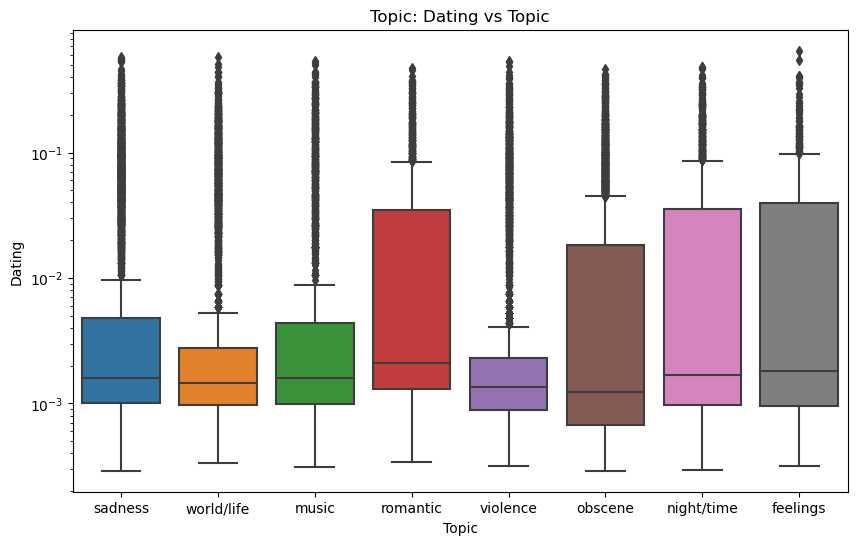

In [111]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="topic", y="dating")
plt.title("Topic: Dating vs Topic")
plt.xlabel("Topic")
plt.yscale("log")
plt.ylabel("Dating")
plt.xticks(rotation=0)
plt.show()

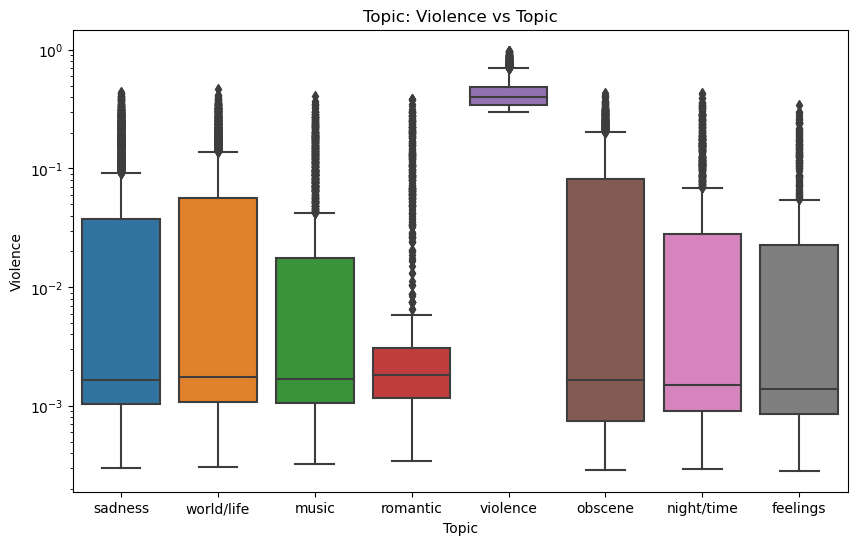

In [112]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="topic", y="violence")
plt.title("Topic: Violence vs Topic")
plt.xlabel("Topic")
plt.yscale("log")
plt.ylabel("Violence")
plt.xticks(rotation=0)
plt.show()

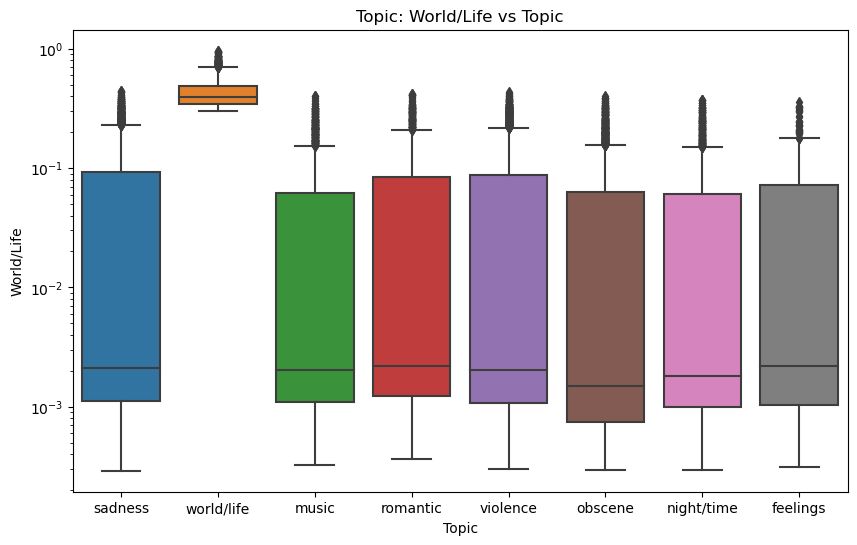

In [113]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="topic", y="world/life")
plt.title("Topic: World/Life vs Topic")
plt.xlabel("Topic")
plt.yscale("log")
plt.ylabel("World/Life")
plt.xticks(rotation=0)
plt.show()

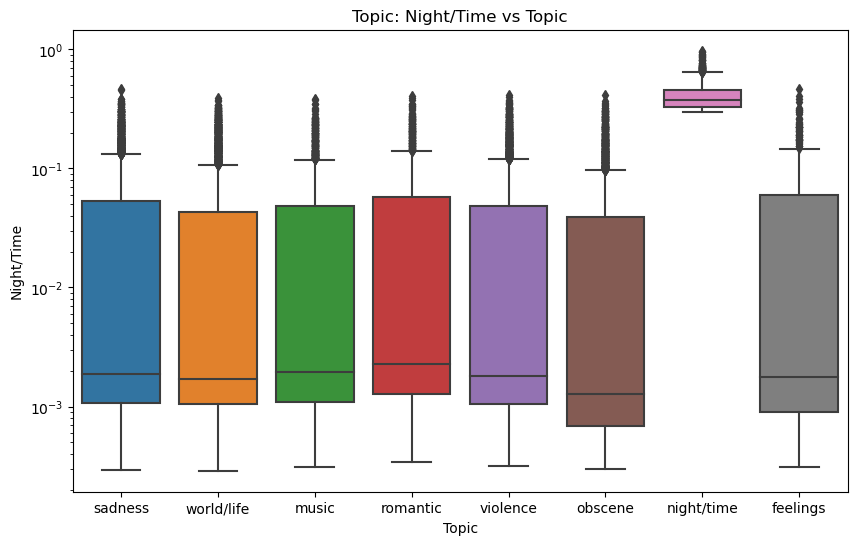

In [114]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="topic", y="night/time")
plt.title("Topic: Night/Time vs Topic")
plt.xlabel("Topic")
plt.yscale("log")
plt.ylabel("Night/Time")
plt.xticks(rotation=0)
plt.show()

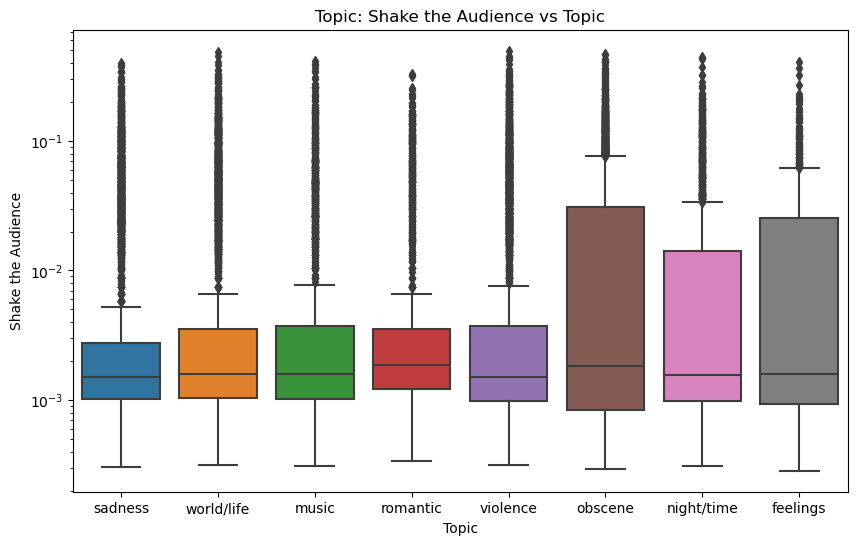

In [115]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="topic", y="shake the audience")
plt.title("Topic: Shake the Audience vs Topic")
plt.xlabel("Topic")
plt.yscale("log")
plt.ylabel("Shake the Audience")
plt.xticks(rotation=0)
plt.show()

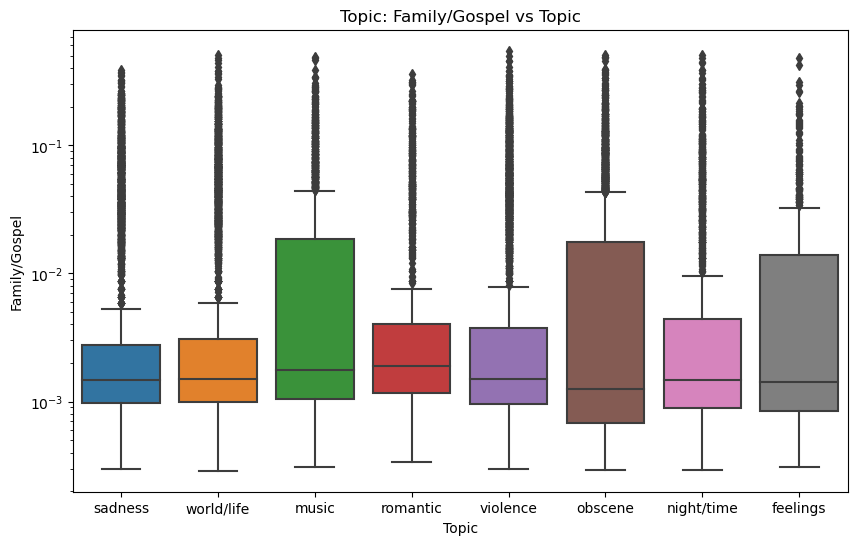

In [116]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="topic", y="family/gospel")
plt.title("Topic: Family/Gospel vs Topic")
plt.xlabel("Topic")
plt.yscale("log")
plt.ylabel("Family/Gospel")
plt.xticks(rotation=0)
plt.show()

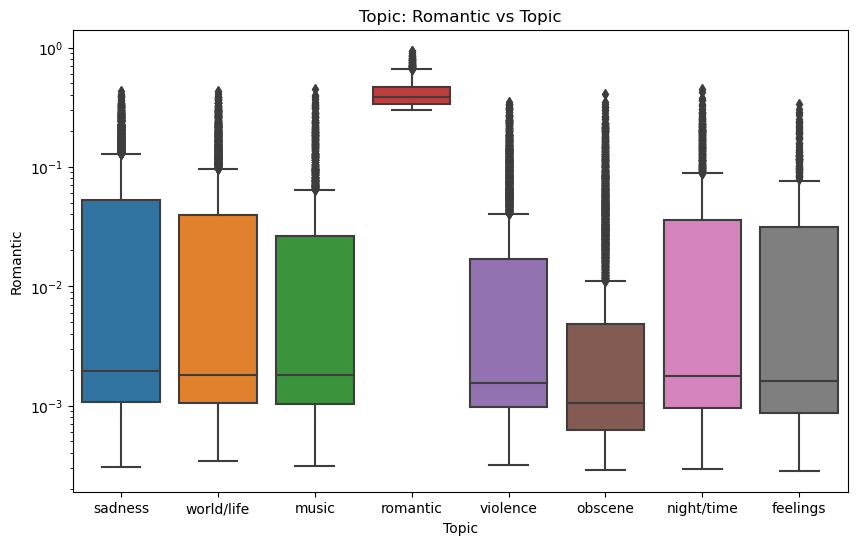

In [117]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="topic", y="romantic")
plt.title("Topic: Romantic vs Topic")
plt.xlabel("Topic")
plt.yscale("log")
plt.ylabel("Romantic")
plt.xticks(rotation=0)
plt.show()

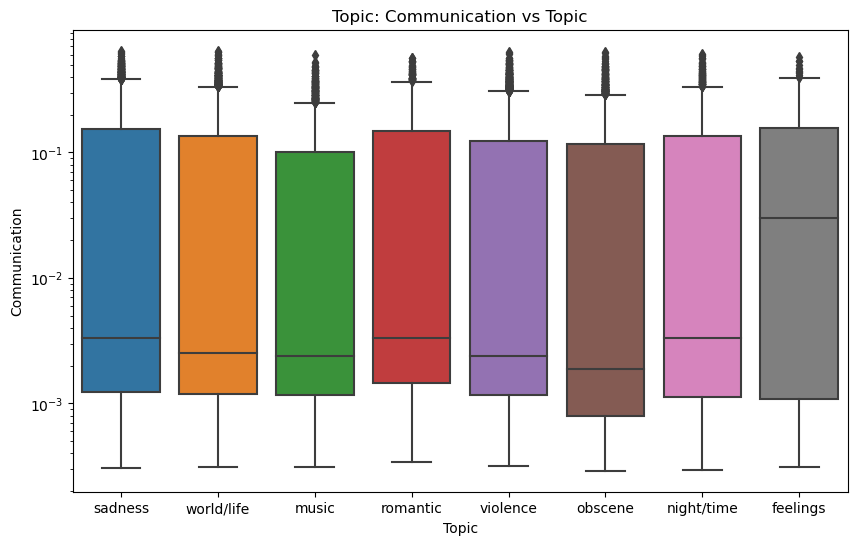

In [118]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="topic", y="communication")
plt.title("Topic: Communication vs Topic")
plt.xlabel("Topic")
plt.yscale("log")
plt.ylabel("Communication")
plt.xticks(rotation=0)
plt.show()

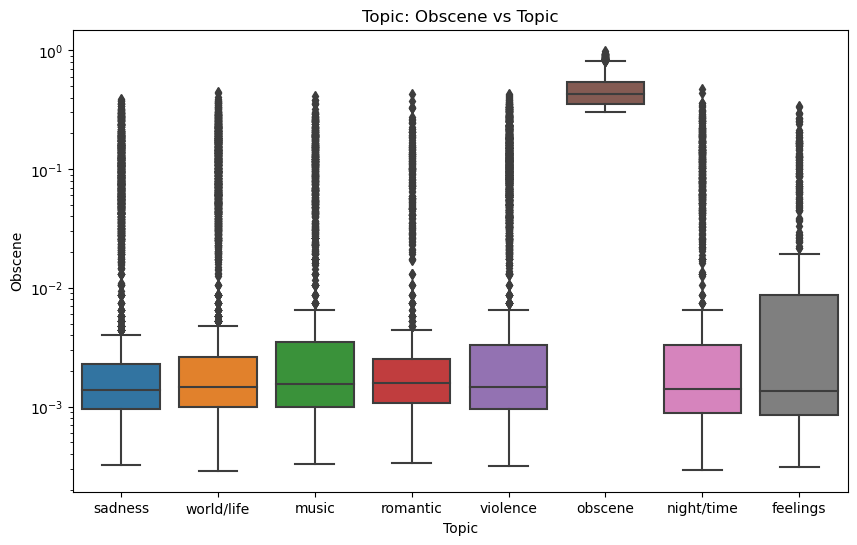

In [119]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="topic", y="obscene")
plt.title("Topic: Obscene vs Topic")
plt.xlabel("Topic")
plt.yscale("log")
plt.ylabel("Obscene")
plt.xticks(rotation=0)
plt.show()

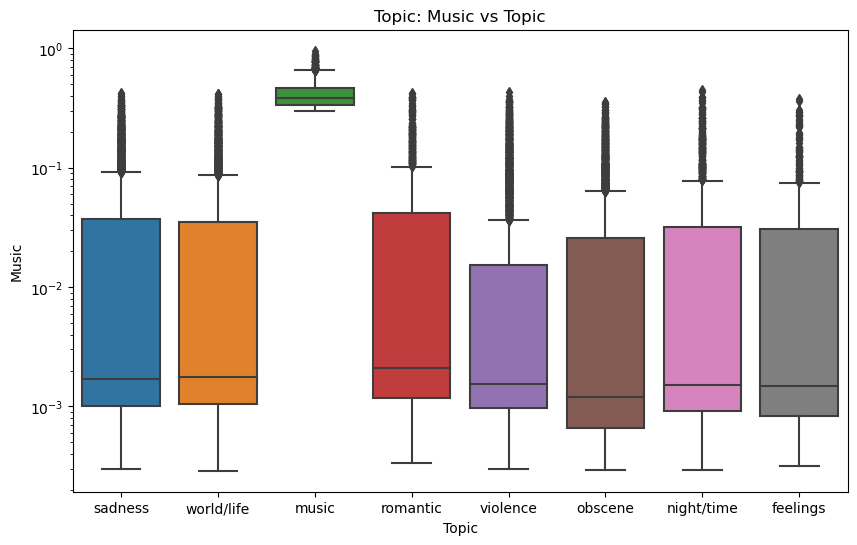

In [120]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="topic", y="music")
plt.title("Topic: Music vs Topic")
plt.xlabel("Topic")
plt.yscale("log")
plt.ylabel("Music")
plt.xticks(rotation=0)
plt.show()

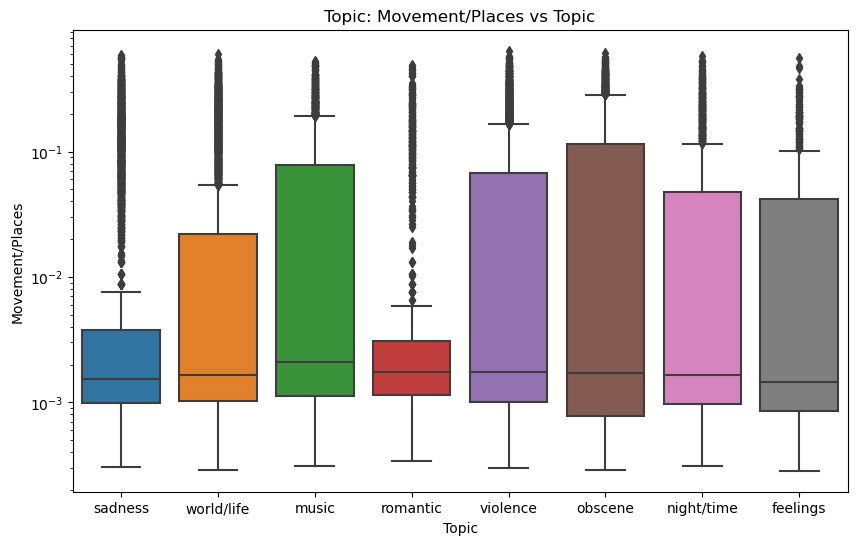

In [121]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="topic", y="movement/places")
plt.title("Topic: Movement/Places vs Topic")
plt.xlabel("Topic")
plt.yscale("log")
plt.ylabel("Movement/Places")
plt.xticks(rotation=0)
plt.show()

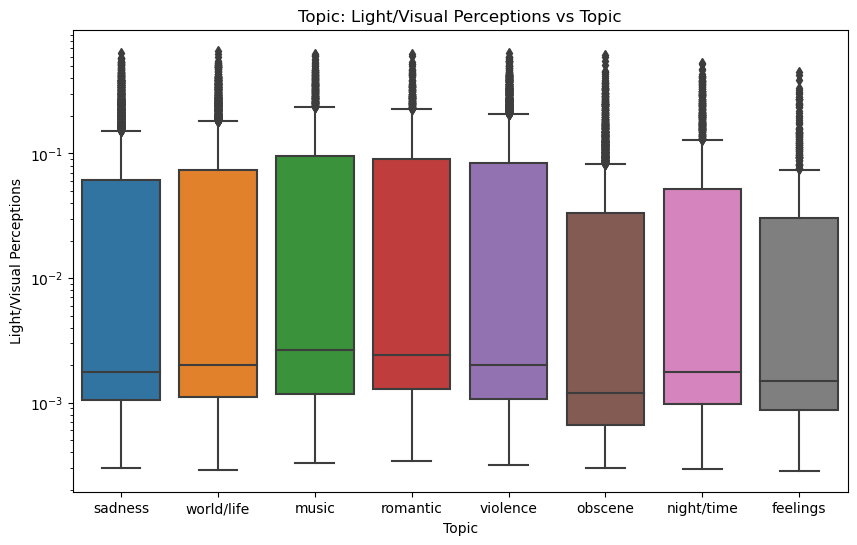

In [122]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="topic", y="light/visual perceptions")
plt.title("Topic: Light/Visual Perceptions vs Topic")
plt.xlabel("Topic")
plt.yscale("log")
plt.ylabel("Light/Visual Perceptions")
plt.xticks(rotation=0)
plt.show()

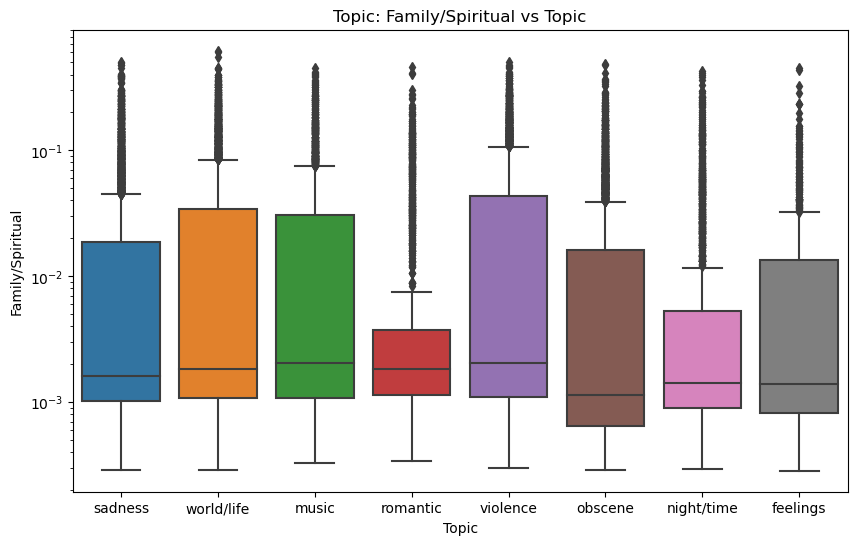

In [123]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="topic", y="family/spiritual")
plt.title("Topic: Family/Spiritual vs Topic")
plt.xlabel("Topic")
plt.yscale("log")
plt.ylabel("Family/Spiritual")
plt.xticks(rotation=0)
plt.show()

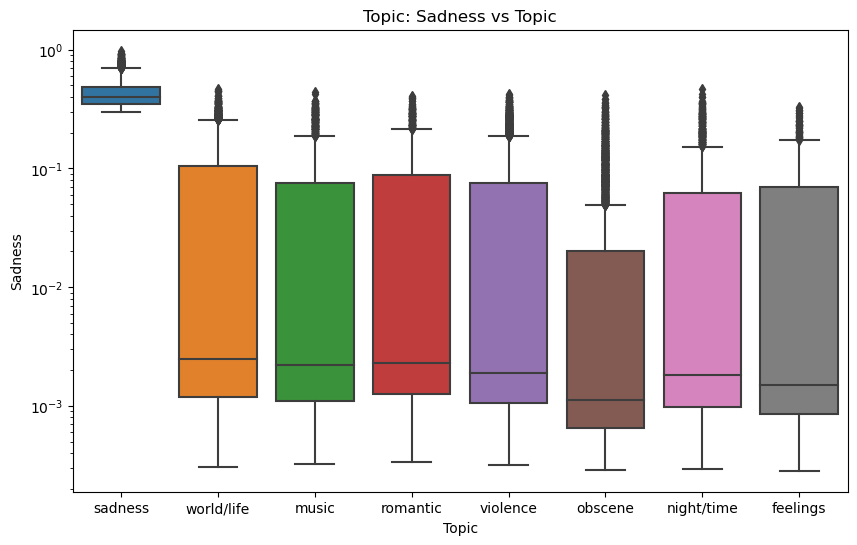

In [124]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="topic", y="sadness")
plt.title("Topic: Sadness vs Topic")
plt.xlabel("Topic")
plt.yscale("log")
plt.ylabel("Sadness")
plt.xticks(rotation=0)
plt.show()

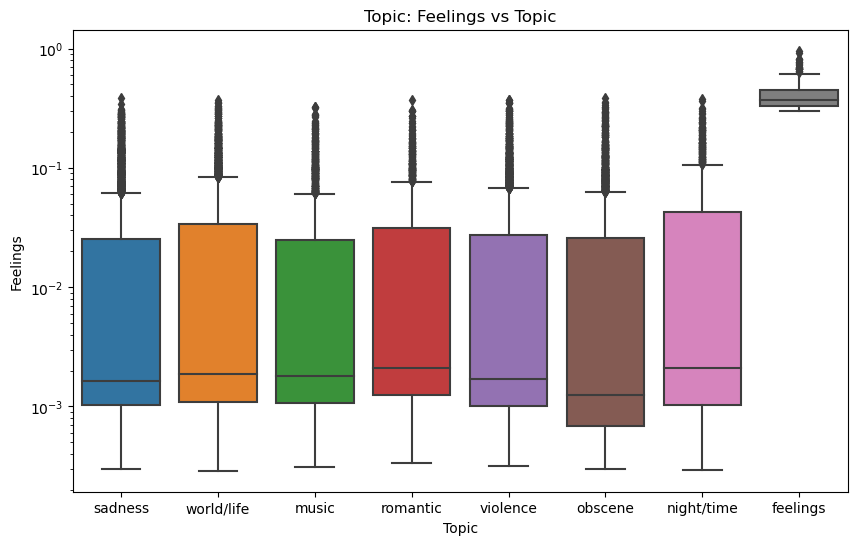

In [125]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="topic", y="feelings")
plt.title("Topic: Feelings vs Topic")
plt.xlabel("Topic")
plt.yscale("log")
plt.ylabel("Feelings")
plt.xticks(rotation=0)
plt.show()

In [150]:
# quantitative vs quantitative
df = df.drop(columns="Unnamed: 0")

c:\Users\sance\anaconda3\envs\phase1\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


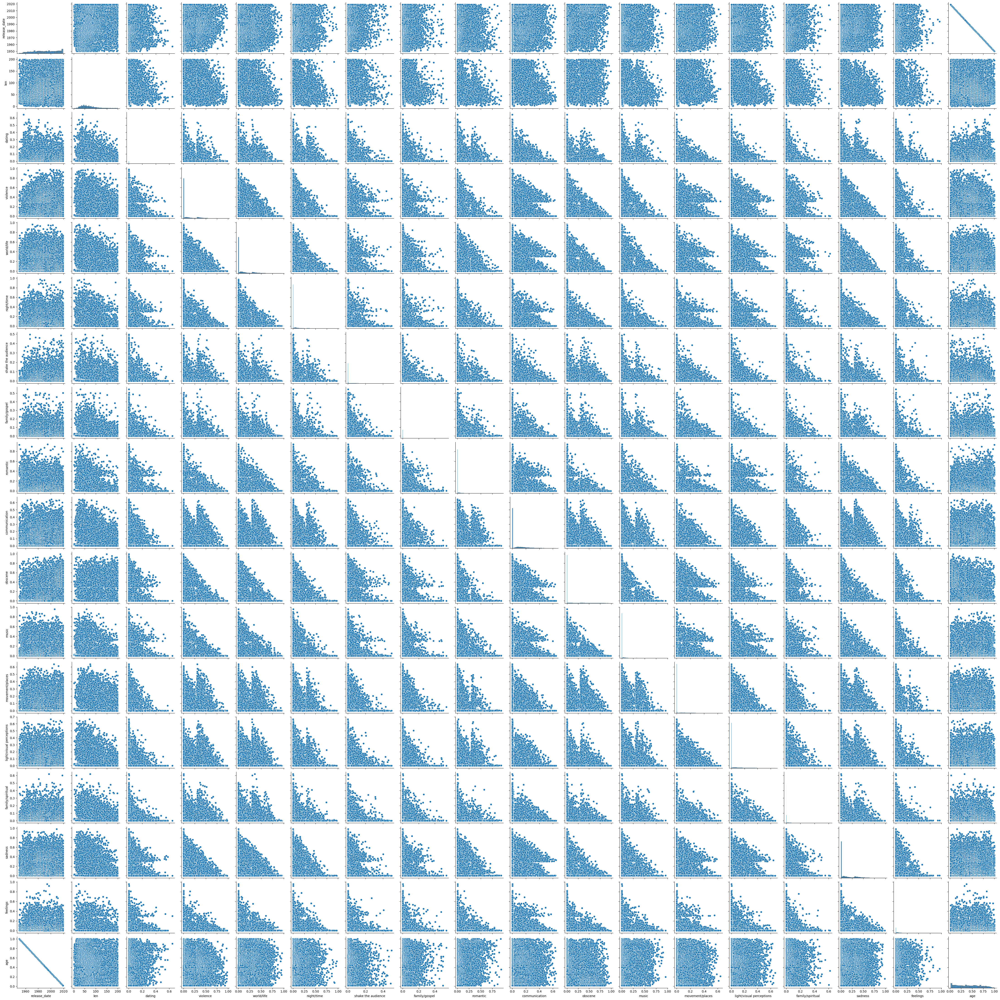

In [151]:
sns.pairplot(df)

no obvious patterns in these graphs
age and release_date have a perfect negative linear relationship, removing release_date would be much better for modelling
the scatterplots between a 0-.70 and a 0-1.0 look similar to the histograms for the 0-.70; one's between two 0-1.0 or two 0-.70 look similar to histograms for 0-1.0


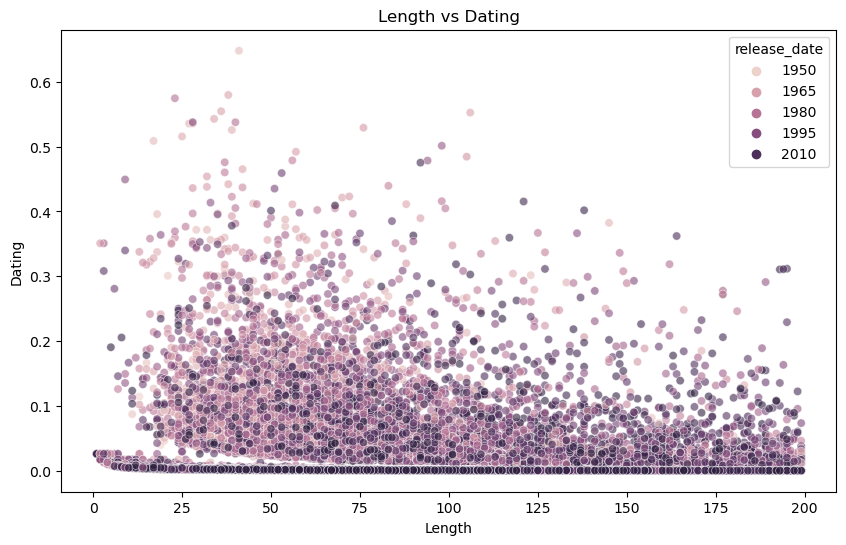

In [144]:
# quantitative vs quantitative (alt)
# hue is categorical

plt.figure(figsize=(10, 6))
sns.scatterplot(x="len", y="dating", hue="release_date", data=df, alpha=0.6)
plt.title("Length vs Dating")
plt.xlabel("Length")
plt.ylabel("Dating")
plt.show()

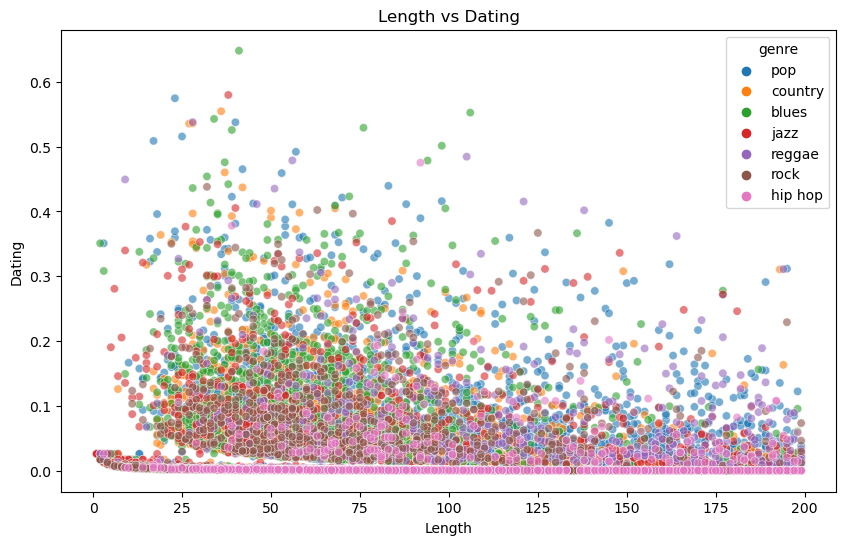

In [145]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x="len", y="dating", hue="genre", data=df, alpha=0.6)
plt.title("Length vs Dating")
plt.xlabel("Length")
plt.ylabel("Dating")
plt.show()

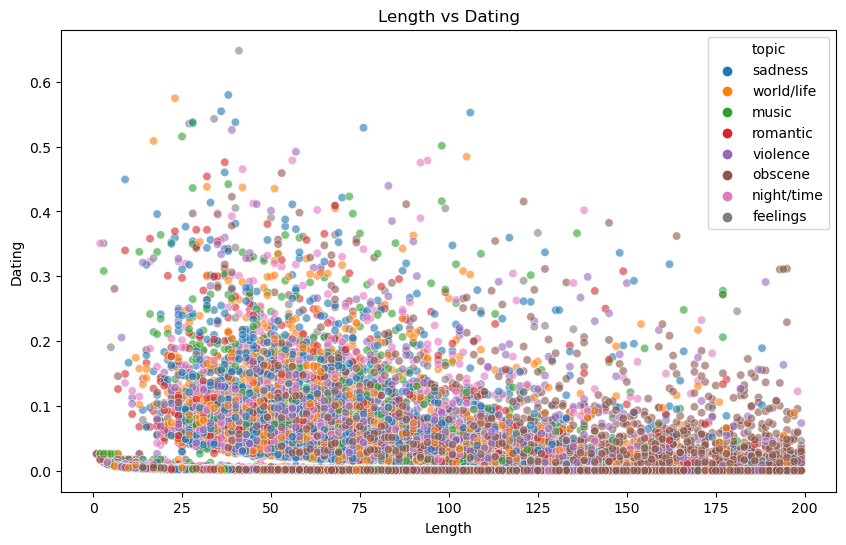

In [146]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x="len", y="dating", hue="topic", data=df, alpha=0.6)
plt.title("Length vs Dating")
plt.xlabel("Length")
plt.ylabel("Dating")
plt.show()

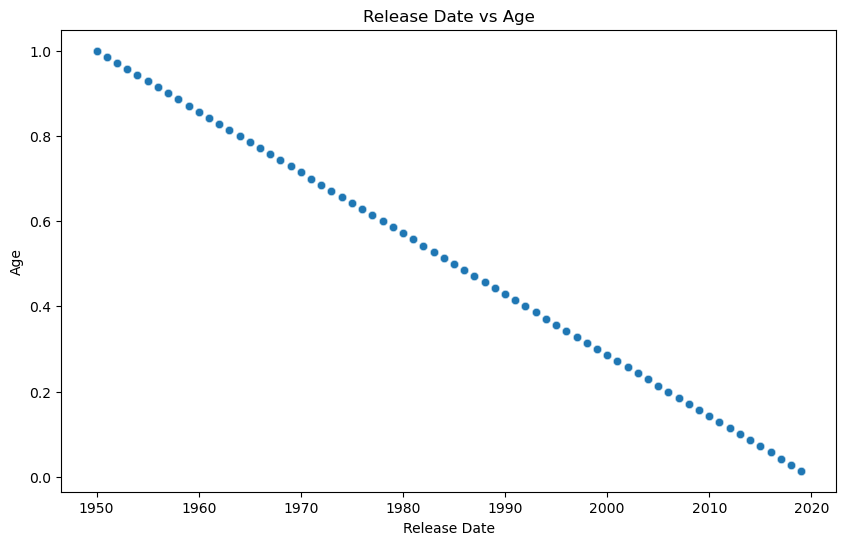

In [147]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x="release_date", y="age", data=df, alpha=0.6)
plt.title("Release Date vs Age")
plt.xlabel("Release Date")
plt.ylabel("Age")
plt.show()

visualizations:

more relevant:      {artist_name}, genre, topic (both the column named topic, and columns of specific topics)
medium relevant:    release_date (album; contemporary vs classic), age, lyrics [similarity; percentage of unique words]
less relevant:      {track_name}

categorical:                            quatitative:
artist_name         track_name          len     dating
release_date    genre                   violence ...    sadness
[lyrics(???)]   topic                   feelings    age

data in release_date and age occupy the same niche; release_date is categorical, age is quantitative